In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import scipy.io
import os

In [2]:
v_th=0.6
SC_base_dir= '/gerda/mcintosh_lab/jgriffiths/hcp_wuminn_l2k8_tracks_conmats/data/results/hcp_wuminn/tractography/dipy/l2k8/'
TS_base_dir='/gerda/mcintosh_lab/jgriffiths/hcp_wuminn_l2k8_rsfmri_ts/data/results/'
out_dir =  '/brunhild/mcintosh_lab/jwang/ModelFitting/DecoWeights/' #'/brunhild/mcintosh_lab/jwang/ModelFitting/Linear_gains/'
import pandas as pd
#groups =[grp for grp in os.listdir(base_dir)]
TS_df=pd.read_pickle('/scratch/mcintosh_lab/jgriffiths/hcp_wuminn_l2k8_rsfmri_ts_LATEST/data/results/100307_rfMRI_REST1_LR_hpc200_clean__l2k8_sc33_ts.pkl')

In [3]:
TS=TS_df.values

In [1]:
def sigmoid(x):
    return 1.0/(1+np.exp(-x))
def smooth_normalize(x):
        x[x< 0.000001] =0.000001
    
        return x
def f_diffusion_tr_noise(X, Wo, Theta):
    
    def smooth_normalize_ct(x, center):
        return center+ (center-0.001)*np.tanh((x-center)/(center - 0.001))
    def smooth_normalize(x):
        x[x< 0.000001] =0.000001
    
        return x

    def sigmoid(a, b, d, x):
        return np.abs(a*x-b)/(0.00001+np.abs(1.00-np.exp(-d*(a*x-b))))
    G = 5000.0/0.4590/0.641  + 4000.*np.tanh(Theta[4:5])
    #G=5000.0/0.4590/0.641 + smooth_normalize(Theta[4:5])
    W_n = np.reshape(Theta[5:], [batch_size,batch_size])
    W_n = 1+ np.tanh((W_n+W_n.T)/2.0)
    W_n = W_n * Wo
    
    Ws = W_n/np.linalg.norm(W_n)
    gEI= 0.1 + smooth_normalize(Theta[0:1])
    W1= .1 + smooth_normalize(Theta[1:2])
    #gEE= 0.15* (1+np.tanh(Theta[2:3])/5.0)
    gEE= 0.001 + smooth_normalize(Theta[2:3])
    gIE= 0.1+smooth_normalize(Theta[3:4])
    #Tr= 1.
    #step_size = 0.05
    num_para = 0
    dt = step_size
    state_size = np.int(Tr/step_size)
    N=1
    #ROI_size=96
    #Jnmda = 0.15
    #W=(Gi*W0)/np.linalg.norm(Gi*W0)
    L_s = -np.diag(np.sum(Ws, axis= 1)) + Ws
    I0 = 0.3772/1.
    gamma = 0.641/1000.
    gammaI = 1.0/1000.
    #Wplus = .8
    Ie = 0
     #smooth_normalize_ct(_Ji[:,0],1.0)
    aE = 310
    bE = 125
    dE_0 = 0.16
    WE = 1.0 #18.4576#1.0
    
    aI = 615
    bI = 177
    dI_0 = 0.087
    WI = 0.7
    
    tauE = 100.
    tauI = 10.
    
    
    #W1= 0.05
    
    #G = .1
    
    E = X[num_para:num_para+N*ROI_size]#smooth_normalize_ct(X[num_para:num_para+N*ROI_size], 0.5)
    I = X[num_para+N*ROI_size:num_para+2*N*ROI_size]#smooth_normalize_ct(X[num_para+N*ROI_size:num_para+2*N*ROI_size], .5)
    q = X[-N*ROI_size:] #smooth_normalize_ct(X[-N*ROI_size:],1.0)
    v = X[-2*N*ROI_size:-N*ROI_size]#smooth_normalize_ct(X[-2*N*ROI_size:-N*ROI_size],1.)
    f = X[-3*N*ROI_size:-2*N*ROI_size]#smooth_normalize_ct(X[-3*N*ROI_size:-2*N*ROI_size], 1.)
    x = X[-4*N*ROI_size:-3*N*ROI_size]#np.tanh(X[-4*N*ROI_size:-3*N*ROI_size])#smooth_normalize(X[-4*N*ROI_size:-3*N*ROI_size], .5)
    #print(E.shape)
    #subID='AD_016_S_4902.mat'
    
    
    rho=0.34;
    tau_0=0.98;
    #tau_s=0.8;
    #tau_f=0.4;
    alpha =0.32;
    #s=0.5;
    #E = np.tanh(E/200.0)
    #I =np.tanh(I/200.0)
    def fout(v, k):
        return (k*v)**(1.0/alpha)/k
    def Ef(f,k):
        return 1.0-(1.0- rho)**(1.0/f/k)
    
    
    k = 1.
    #x=x/(np.max(np.abs(x))+0.002)
    #print E.shape
    sigma = 1.
    
    epsilon = 1.0 #+ 0.2 *np.tanh(Theta[5:6]) # smooth_normalize(X[5:6], 0.5)
    tau_s = 0.65 #+ 0.2 *np.tanh(Theta[6:7])
    tau_f = 0.41 #+ 0.2 *np.tanh(Theta[7:8])
    for i in range(state_size):
        
        IE = 1*WE*I0 + gEE*E + G*np.dot(L_s, E) -gIE*(I) + Ie
        II = WI*I0 + gEI*E - I 
         
        dE =  E - dt*(E+gamma*3.0631*tauE)/tauE \
           -dt*E*gamma*(3.0631+0.4590*np.tanh(IE- 0.3772)) + dt*gamma*(3.0631+0.4590*(IE - 0.3772))\
                +W1*np.sqrt(dt/state_size)*np.random.randn(ROI_size)
            
        
        dI =  I - dt*(I)/tauI \
             + dt*gammaI*sigmoid(aI, bI, dI_0, II)\
            +W1*np.sqrt(dt/state_size)*np.random.randn(ROI_size)
        
        
        dx = x+dt*(epsilon*(E)/sigma \
                   -1.0/tau_s*x \
               -1.0/tau_f *(k*f-1))
        f_tmp= f+dt*1/k*x
        dv= v+dt*(f/tau_0 -fout(v,k)/tau_0)
        dq= q+ dt*(f*Ef(f,k)/rho/tau_0\
                  -q/v*fout(v,k)/tau_0)
        df = f_tmp
        
        x = np.tanh(dx) #smooth_normalize(dx, 0.5)
        v = smooth_normalize_ct(dv, 1.0) #a+ b*np.tanh((dv-a)/b)
        f = smooth_normalize_ct(df, 1.0) #a+ b*np.tanh((df-a)/b)
        q = smooth_normalize_ct(dq, 1.0) #a+ b*np.tanh((dq-a)/b)
        E = np.tanh(dE)#1.0 + np.tanh(dE - 1.0) #smooth_normalize_ct(dE, 1.0)#np.tanh(dE/200.0)
        I = np.tanh(dI)#1.0 + np.tanh(dI - 1.0)#smooth_normalize_ct(dI, 1.0)#np.tanh(dI/200.0)
    """return np.concatenate((g1,g2,g12,g21,sigma,epsilon,tau_s,tau_f,\
                           E, I, x, f, v, q))"""
    return np.concatenate((E, I, x, f, v, q))

def h_diffusion_noise(X, Theta):
    def smooth_normalize_ct(x, center):
        return center+ (center-0.001)*np.tanh((x-center)/(center - 0.001))
    def smooth_normalize(x):
        x[x< 0.000001] =0.000001
    
        return x

   
    
    W2= 0.02 #Theta[3:4]#0.02 + smooth_normalize(Theta[3:4])
    E0=0.34
    rho=0.34
    k1 = 7*E0
    k2 = 2.
    k3 = 2*E0-0.2
    #w= Theta[3:4]
    #W2 = 0.01
    V = 0.02 #1.0 + smooth_normalize(Theta[9:10])
    #V= 30.0
    q = smooth_normalize_ct(X[-ROI_size:],1.0)
    v = smooth_normalize_ct(X[-2*ROI_size:-ROI_size],1.0)
    k= 1.
    #v = a+ a*np.tanh((v-a)/a)/1.1
    y= k1*(1-k*q)+k2*(1-q/v)+k3*(1-k*v)
    #q = a+ a*np.tanh((q-a)/a)/1.1
    return 100.0/E0*V*(y)+W2*np.random.randn(ROI_size)

In [5]:
Tr= 2.
num_epochs =15*1
echo_step = 1
num_data = TS.shape[0]
truncated_backprop_length = 15
total_series_length = num_data -echo_step #50000

step_size = 0.1
state_size = 6 #np.int(6* Tr/step_size)

num_classes = 1
batch_size = 83
num_batches = total_series_length//truncated_backprop_length

In [6]:
tf.reset_default_graph()
    
    
L_new = tf.placeholder(tf.float32, [batch_size, batch_size])
batchX_placeholder = tf.placeholder(tf.float32, [batch_size, 1+truncated_backprop_length+2*truncated_backprop_length*np.int(Tr/step_size)])
batchY_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])



def fout(v):
    return tf.pow(v, tf.constant(1./.2, dtype=tf.float32))
def Ef(f):
    rho = 0.34
    return tf.constant(1., dtype=tf.float32)-tf.pow(tf.constant(1.-rho, dtype=tf.float32), tf.reciprocal(f))
def h_tf(a, b, d, x):
    return tf.abs(a*x-b)/(0.00001+tf.abs(1.0 -tf.exp(-d*(a*x-b))))

def smooth_normalize_ct(x, center):
    
    
    return center+ (center-0.001)*tf.tanh((x-center)/(center - 0.001))





sigma = tf.constant(1.0, dtype=tf.float32) 
epsilon = tf.constant(1.0, dtype=tf.float32)# + 0.3 *np.tanh(X[5:6]) # smooth_normalize(X[5:6], 0.5)
tau_s = tf.constant(0.65, dtype=tf.float32)# + 0.2 *np.tanh(X[6:7])
tau_f = tf.constant(0.41, dtype=tf.float32)# + 0.3 *np.tanh(X[7:8])

I0=tf.constant(0.3772, dtype=tf.float32)
gamma = tf.constant(0.641/1000.0, dtype=tf.float32)
gammaI = tf.constant(1/1000.0, dtype=tf.float32)

Ie = tf.constant(0.0, dtype=tf.float32)

aE=tf.constant(310, dtype=tf.float32)
bE = tf.constant(125, dtype=tf.float32)
dE =tf.constant(0.16, dtype=tf.float32)
WE= tf.constant(1, dtype=tf.float32)
tauE= tf.constant(100, dtype=tf.float32)

aI=tf.constant(615, dtype=tf.float32)
bI = tf.constant(177, dtype=tf.float32)
dI =tf.constant(0.087, dtype=tf.float32)
WI= tf.constant(0.7, dtype=tf.float32)
tauI= tf.constant(10, dtype=tf.float32)

rho=tf.constant(0.34, dtype=tf.float32)
E0=tf.constant(0.34, dtype=tf.float32)
k1 = tf.constant(7*0.34, dtype=tf.float32)
k2 =tf.constant( 2, dtype=tf.float32)
k3 = tf.constant(2*0.34-0.2, dtype=tf.float32)
   
V = tf.constant(0.02, dtype=tf.float32)
rho= tf.constant(0.34, dtype=tf.float32)
tau_0= tf.constant(0.98, dtype=tf.float32) 
    #tau_s=0.8;
    #tau_f=0.4;
alpha =tf.constant(0.32, dtype=tf.float32)

dt=tf.constant(step_size, dtype=tf.float32)
   
E_fr= tf.constant(np.zeros((batch_size,1)), dtype=tf.float32)

#gi0 = 1.* np.zeros((batch_size,1))
Ws0 = np.zeros((batch_size,batch_size))+0.05
g0 = 0.
   
W1 = tf.Variable(0.5, dtype=tf.float32)
gEE =tf.Variable(0.15, dtype=tf.float32)
G = tf.Variable(g0, dtype=tf.float32)
#Gi = tf.Variable(gi0, dtype=tf.float32)
Ws = tf.Variable(Ws0, dtype=tf.float32)
gEI = tf.Variable(.15, dtype=tf.float32)

gIE = tf.Variable(1.0, dtype=tf.float32)   
    

# Unpack columns

inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

W_n= 1+tf.tanh((Ws+tf.transpose(Ws))/2.0)
W_n = W_n * L_new

W_s =W_n/tf.norm(W_n)
L= -tf.diag(tf.reduce_sum(W_s, axis=1)) + W_s

# Forward pass
current_state = init_state
#current_state = _current_state
states_series = []
inhi_series = []
logits_series = []
noise2 = inputs_series[-truncated_backprop_length-1:-1]
noise_c = inputs_series[-1]


for j, label_tmp in enumerate(labels_series):
    #current_input = tf.reshape(current_input, [batch_size, 1])
    #input_and_state_concatenated = tf.concat([current_input, current_state],1)  # Increasing number of columns
    
    
  
    E=current_state[:,0:1]
    I=current_state[:,1:2]
    x=current_state[:,2:3]
    f=current_state[:,3:4]
    v=current_state[:,4:5]
    q=current_state[:,5:6]
    
    G_p = 5000./0.641/0.459 +4000.*tf.tanh(G)
    #G_p = 5000./0.641/0.459 +tf.nn.relu(G)
    gIE_p = 0.1+ tf.nn.relu(gIE) #smooth_normalize_ct(Ji, tf.constant(1.0, dtype=tf.float32), tf.constant(0.0, dtype=tf.float32), tf.constant(1.0, dtype=tf.float32))
    
    gEI_p =0.1+tf.nn.relu(gEI)
    gEE_p =0.001+ tf.nn.relu(gEE)
    
    
    W1_p = .1 + tf.nn.relu(W1)
    #W2_p = 0.01 + tf.nn.relu(W2)
    #W = (Gi_p*L_new)/tf.norm(Gi_p*L_new)
    #L = -tf.diag(tf.reduce_sum(W, axis=1)) + W
    for i in range(np.int(Tr/step_size)):
        noise = tf.reshape(inputs_series[j*np.int(Tr/step_size)+i],[batch_size, 1] )
        noise1 = tf.reshape(inputs_series[truncated_backprop_length*np.int(Tr/step_size)\
                                          +j*np.int(Tr/step_size)+i],[batch_size, 1] )
        IE = WE*I0 + gEE_p*E + G_p*tf.matmul(L, E) -gIE_p*(I) + Ie
        II = WI*I0 + gEI_p*E - I
        
        #IE = 125/310.0 -0.026 +0.006*tf.tanh(IE/100. - 125/310.0 + 0.026) 
        #(3.0631+0.4869*tf.tanh(h_tf(aE, bE, dE, IE)-3.0631)) 
        E_new =E - dt*(E+gamma*tauE*3.0631)/tauE \
                    + dt*gamma*(3.0631+0.4590*(IE-0.3772))\
                     - dt*E*gamma*(3.0631+0.4590*tf.tanh(IE-0.3772))\
                    +W1_p*tf.sqrt(dt/tf.constant(Tr/step_size, dtype=tf.float32))*noise
        I_new =I - dt*(I)/tauI \
                   + dt*gammaI*h_tf(aI, bI, dI, II) \
                   +W1_p*tf.sqrt(dt/tf.constant(Tr/step_size, dtype=tf.float32))*noise1
    
    
        dx = x+dt*(epsilon*E/sigma\
                   -tf.constant(1., dtype=tf.float32)/tau_s*x  \
                   -tf.constant(1., dtype=tf.float32)/tau_f*(f-tf.constant(1., dtype=tf.float32)))
        f_tmp= f+dt*x 
        dv= v+dt*(f/tau_0 -fout(v)/tau_0) 
        dq=q+ dt*(tf.multiply(f,Ef(f))/rho/tau_0-tf.multiply(tf.divide(q,v) ,fout(v)) /tau_0)
        v=smooth_normalize_ct(dv, 1.0)
        q=smooth_normalize_ct(dq, 1.0)
        f=smooth_normalize_ct(f_tmp, 1.0)
        x= tf.tanh(dx)
        E= tf.tanh(E_new) #smooth_normalize_ct(E_new, tf.constant(1., dtype=tf.float32), tf.constant(0., dtype=tf.float32), tf.constant(1.0, dtype=tf.float32))
        I= tf.tanh(I_new) #smooth_normalize_ct(I_new, tf.constant(1., dtype=tf.float32), tf.constant(0., dtype=tf.float32), tf.constant(1.0, dtype=tf.float32))
        
        #E_fr = sigmoid_tf(aE, bE, dE, IE)
    next_state = tf.concat([E, I, x, f, v, q],1)  # Broadcasted addition
    #IE = WE*I0 + Wplus_p*Jnmda_p*E + G_p*Jnmda_p*tf.matmul(W, E) -tf.multiply(Ji_p,I) + Ie
    #E_fr = h_tf(aE, bE, dE, IE)
    states_series.append(next_state)
    #inhi_series.append(E_fr)
    current_state = next_state 
#current_state = states_series[0]
print(states_series[0].shape)
print(inputs_series[0].shape)
print(len(inputs_series))
#logits_series = [tf.reshape(tf.matmul(W2, tf.reshape(tf.tanh(state), [batch_size*state_size, 1])) + b2, [batch_size,]) for state in states_series]#Broadcasted addition

logits_series = [100/E0*V*(k1*(tf.constant(1., dtype=tf.float32)-state[:, 5])\
                 +k2*(tf.constant(1., dtype=tf.float32)-tf.divide(state[:, 5],state[:, 4]))\
                 +k3*(tf.constant(1., dtype=tf.float32)-state[:, 4]))\
                 +0.02*noise   for state, noise in zip(states_series, noise2)]
print(logits_series[0].shape)
print(labels_series[0].shape)

predictions_series = logits_series

labels_series_tf = tf.stack(labels_series,axis=1)
logits_series_tf = tf.stack(logits_series,axis=1)
#labels_series_tf = labels_series[0]
#logits_series_tf = states_series[0]
labels_series_tf_n = labels_series_tf - tf.matmul(tf.reshape(tf.reduce_mean(labels_series_tf, 1), [batch_size,1]),\
                            tf.constant(np.ones((1,truncated_backprop_length)), dtype=tf.float32))
logits_series_tf_n = logits_series_tf - tf.matmul(tf.reshape(tf.reduce_mean(logits_series_tf, 1), [batch_size,1]),\
                            tf.constant(np.ones((1,truncated_backprop_length)), dtype=tf.float32))


cov_sim =tf.matmul(logits_series_tf_n, tf.transpose(logits_series_tf_n))
cov_def= tf.matmul(labels_series_tf_n, tf.transpose(labels_series_tf_n))


FC_sim_T = tf.matmul(tf.matmul(tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_sim)))), cov_sim), \
                     tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_sim)))))
FC_T = tf.matmul(tf.matmul(tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_def)))), cov_def), \
                 tf.diag(tf.reciprocal(tf.sqrt(tf.diag_part(cov_def))))) 
#FC_T= tf.constant(FC, dtype=tf.float32)

ones_tri=np.tril(np.ones((83,83)),-1)#tf.matrix_band_part(tf.ones_like(FC_T)-tf.diag(tf.ones((batch_size,))), 0, -1)
#zeros = tf.zeros_like(FC_T) # create a tensor all ones
mask = ones_tri> 0.0#tf.greater(ones_tri, zeros) # boolean tensor, mask[i] = True iff x[i] > 1
FC_tri_v = tf.boolean_mask(FC_T, mask)

FC_v = FC_tri_v - tf.reduce_mean(FC_tri_v)*tf.ones_like(FC_tri_v)


FC_sim_tri_v = tf.boolean_mask(FC_sim_T, mask)
FC_sim_v = FC_sim_tri_v - tf.reduce_mean(FC_sim_tri_v)*tf.ones_like(FC_sim_tri_v)

corr_FC =tf.reduce_sum(tf.multiply(FC_v,FC_sim_v))\
                  /tf.sqrt(tf.reduce_sum(tf.multiply(FC_v,FC_v)))\
                /tf.sqrt(tf.reduce_sum(tf.multiply(FC_sim_v,FC_sim_v)))
        
losses_corr = tf.square(1- corr_FC)
losses = tf.sqrt(tf.reduce_mean(tf.multiply(FC_sim_v-FC_v, FC_sim_v-FC_v)))
#losses = tf.sqrt(tf.reduce_mean(tf.multiply(cov_sim-cov_def, cov_sim-cov_def)))

    
total_loss = losses_corr +0.5*tf.square(tf.reduce_mean(FC_tri_v)-tf.reduce_mean(FC_sim_tri_v))#+ 0.05*W1**2

#losses = [tf.losses.mean_squared_error(labels, logits) for logits, labels in zip(logits_series,labels_series)]

#total_loss = tf.reduce_mean(losses) #+ 0.01*(g1**2 + 2*g12**2 + g21**2)


opt_func = tf.train.AdamOptimizer(.01)




train_step=opt_func.minimize(total_loss)
#train_step = tf.train.GradientDescentOptimizer(.05).minimize(total_loss)
#train_step = tf.train.MomentumOptimizer(learning_rate=0.08, momentum=0.9).minimize(total_loss)
#train_step = tf.train.AdamOptimizer(0.02).minimize(total_loss)
def plot(batch_idx,  W_s, y_array,x_array, params_list, loss_list, batchX, batchY):
       
    plt.subplot(2, 2, 1)
    plt.cla()
    plt.plot(loss_list)
    
    plt.subplot(2, 2, 2)
    plt.cla()
    plt.plot(params_list)
    
    
    plt.subplot(2, 2, 3)
    plt.cla()
    plt.imshow(W_s)
    
    
    plt.subplot(2, 2, 4)
    plt.cla()
    plt.plot(y_array.T)

    
        
    plt.draw()
    plt.pause(0.0001)

(83, 6)
(83,)
616
(83,)
(83,)


In [7]:
def model_run(subID,L_s, TS):
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        plt.ion()
        plt.figure()
        plt.show()
        loss_list = []
        params_list = []
        
        
       
        Ws_old = list(np.zeros((83,83)).ravel())
        gEI_old = .15
        W1_old = 0.5
        gEE_old = .15
        gIE_old = 1.
        G_old = 100.
   
        loss_array_old = np.zeros((truncated_backprop_length,))
    
    
        for epoch_idx in range(num_epochs):
        
            TS_dmean =(TS.T -TS.T.mean(axis= 0)).T
            y_in= TS.T[:,echo_step:num_data]/np.max(TS)
            if len(loss_list) == 0 or loss_list[len(loss_list)-1]> 0.002:
            
                y_array =np.zeros((batch_size,num_batches*truncated_backprop_length))
                x_array =np.zeros((batch_size,num_batches*truncated_backprop_length))
                
                initi_con = .1*(np.random.uniform(-1,1,[batch_size, state_size])+np.array([[0, 0, 0,1.1,1.1,1.1]]))
                #initi_con[:,0:2]= 0
                _current_state = initi_con
            
            
                params_old = np.array([gEI_old, W1_old,  gEE_old, gIE_old, G_old] + Ws_old)
                #print("New data, epoch", epoch_idx)
                loss_array = np.zeros((num_batches,))
                for batch_idx in range(num_batches):
                
                    
                    #for batch_idx in range(209-truncated_backprop_length):
                    start_idx = batch_idx * truncated_backprop_length
                    #start_idx = batch_idx 
                    end_idx = start_idx + truncated_backprop_length

                    batchX = np.random.randn(batch_size, 1+truncated_backprop_length+2*truncated_backprop_length*np.int(Tr/step_size))
                    batchY = y_in[:,start_idx:end_idx]

                    _W_s, _Ws, _gEI, _G,  _gIE, _W1, _gEE, _total_loss, _train_step, _current_state,\
                               _logits_series, _inhi_series = sess.run(
                    [W_s, Ws, gEI, G, gIE, W1, gEE, total_loss, train_step, current_state, logits_series, inhi_series],
                    feed_dict={
                        batchX_placeholder:batchX,
                        batchY_placeholder:batchY,
                        init_state:_current_state,
                        L_new:L_s
                        })

                    loss_list.append(_total_loss)
                    params_new = np.array([_gEI, _W1, _gEE, _gIE, _G] +list(_Ws.ravel()))#1/(1+np.exp(-_W1))
                    params_list.append(params_new)
                    
                    
                    loss_array[batch_idx] = _total_loss
                
                    for i in range(truncated_backprop_length):
                        start_idx = batch_idx * truncated_backprop_length
                
                        y_array[:, start_idx+i] = _logits_series[i]
                   
                
                
                    #print("Step",batch_idx, "Loss", _total_loss)
                
                
        
       
            
    plot(batch_idx, _W_s, y_array, x_array, params_list, loss_list,  batchX, batchY)        
    plt.ioff()
    plt.show()
    #print(Ji_list)
    np.savetxt(out_dir+'HCP_'+subID+'paramsList_test_1.txt', np.array(params_list))
    #np.savetxt(Out_path+'PPMI_'+subID+'Ji.txt', np.array(Ji_list))
    np.savetxt(out_dir+'HCP_'+subID+'sim_fitting_bold_test_1.txt', y_array.T)
    #y_dmean =(y_array.T -y_array.T.mean(axis= 0)).T
    FC_sim = np.corrcoef(y_array[:,10:])
    
    FC = np.corrcoef(TS.T)
    corr_simfit= np.corrcoef(FC[np.tril_indices(batch_size,-1)], FC_sim[np.tril_indices(batch_size,-1)])[0,1]
    print(corr_simfit)
    #HCP_par_corr[subID].append(corr_simfit)
    fig, ax = plt.subplots(1,3, figsize=(20,4))
    ax[0].plot(TS)
    img1 =ax[1].imshow(FC_sim -np.diag(np.diag(FC_sim)), cmap='bwr')
    plt.colorbar(img1, ax=ax[1], fraction=0.046, pad=0.04)
    img2 =ax[2].imshow(FC, cmap='bwr')
    plt.colorbar(img2, ax=ax[2], fraction=0.046, pad=0.04)
    plt.show()


0 290136


<Figure size 432x288 with 0 Axes>

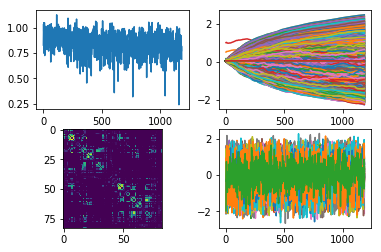

0.547359292117791


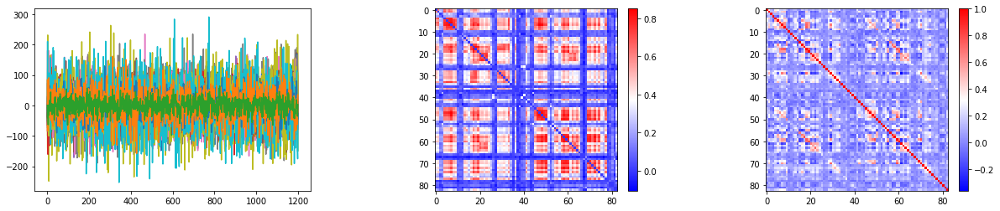

0.5490778733459188


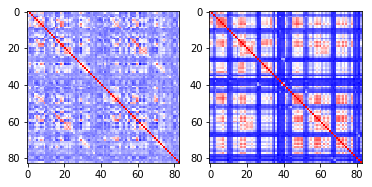

<Figure size 432x288 with 0 Axes>

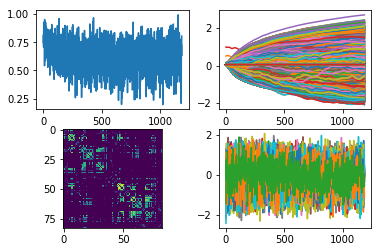

0.9478235240758469


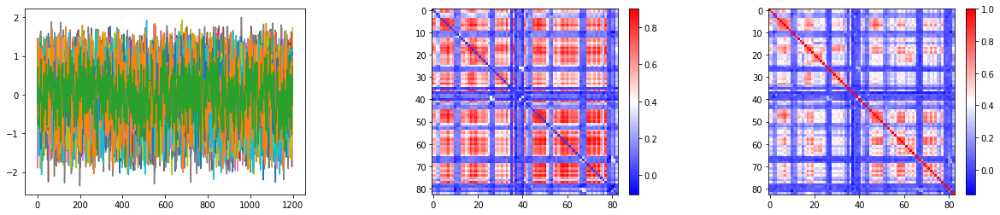

[0.100001, 0.524460244178772, 1.3762489328384397, 0.8664718806743622, 20927.24249595825, 0.5696820914745331, 0.37530839443206787, 1.2492008457183836, 0.8003948628902435, 20958.29246195323]
1 198653


<Figure size 432x288 with 0 Axes>

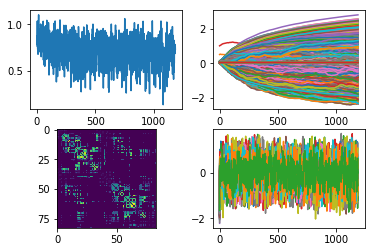

0.7341473723359895


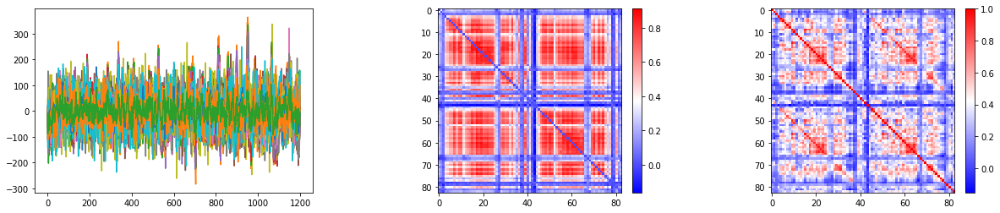

0.735607571838335


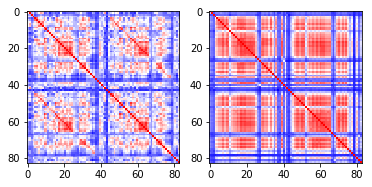

<Figure size 432x288 with 0 Axes>

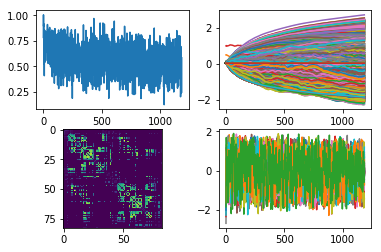

0.958383332457815


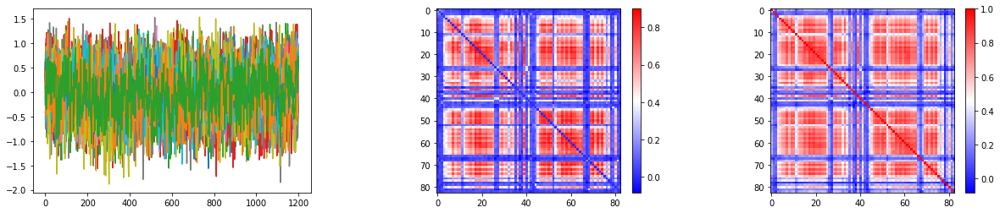

[0.13626647330820563, 0.28191334158182146, 1.5725470194816589, 1.6838440895080566, 20964.038195258563, 0.100001, 0.34501451104879377, 1.6139491567611692, 1.0860565066337586, 20960.190093325]
2 157336


<Figure size 432x288 with 0 Axes>

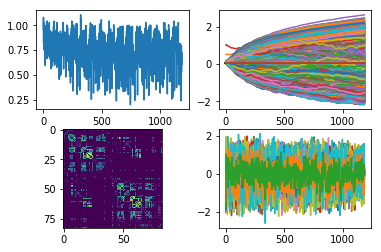

0.7248939577108793


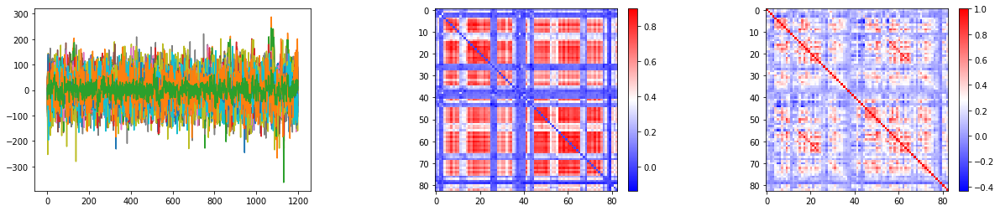

0.722364058427623


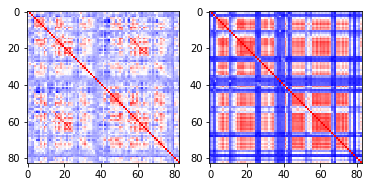

<Figure size 432x288 with 0 Axes>

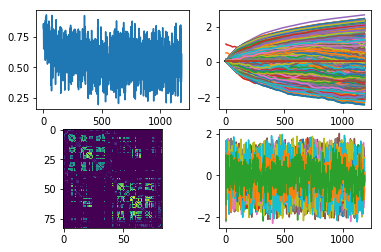

0.9621984176833032


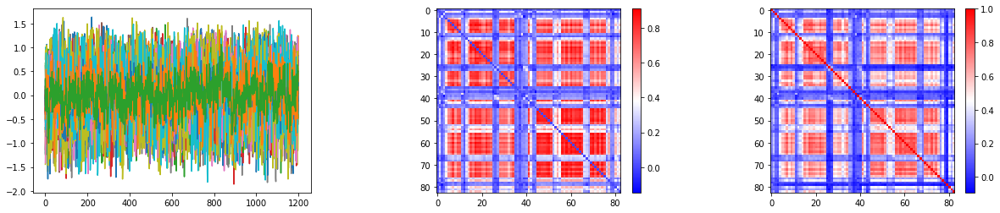

[0.850371116399765, 0.3715005695819855, 1.390533269405365, 0.9365397334098816, 20952.34069672486, 0.6500201642513275, 0.4284363180398941, 2.0200887212753296, 0.7224657893180847, 20954.988316610987]
3 121921
4 145127
5 567961


<Figure size 432x288 with 0 Axes>

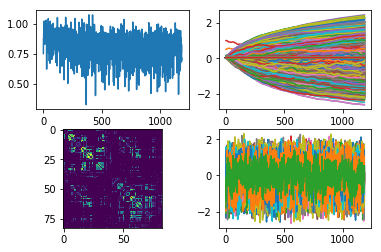

0.609052122748742


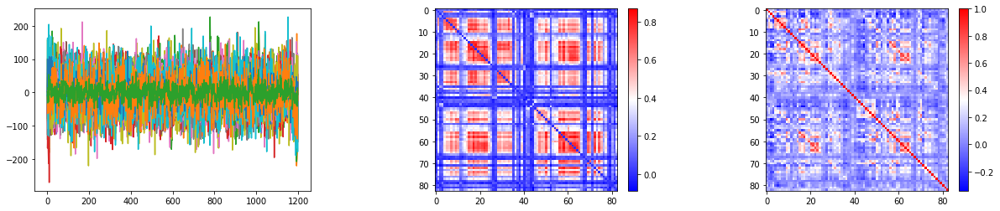

0.6157346146046219


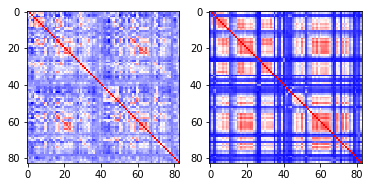

<Figure size 432x288 with 0 Axes>

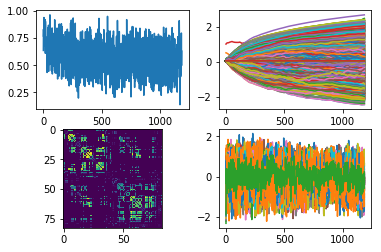

0.9416371763790338


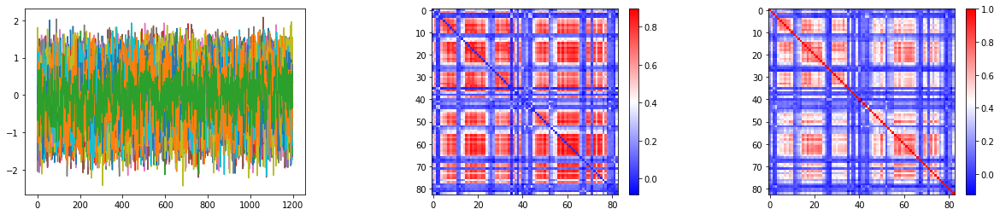

[0.27562947124242787, 0.5586563497781754, 1.2108244071006773, 1.0153311848640443, 20936.275470291926, 0.100001, 0.35887563824653623, 2.4679550657272338, 0.8153562664985656, 20956.533619456306]
6 492754


<Figure size 432x288 with 0 Axes>

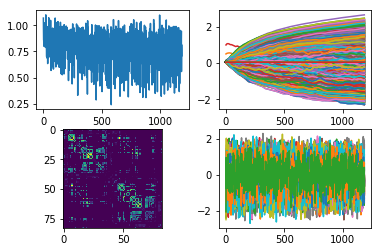

0.5793010611130588


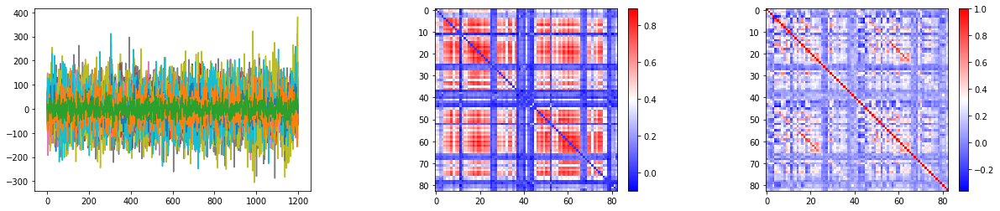

0.5852143488609979


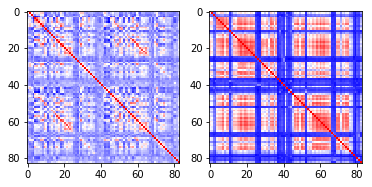

<Figure size 432x288 with 0 Axes>

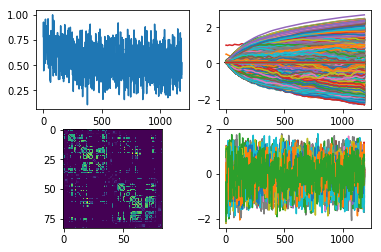

0.9620325031013882


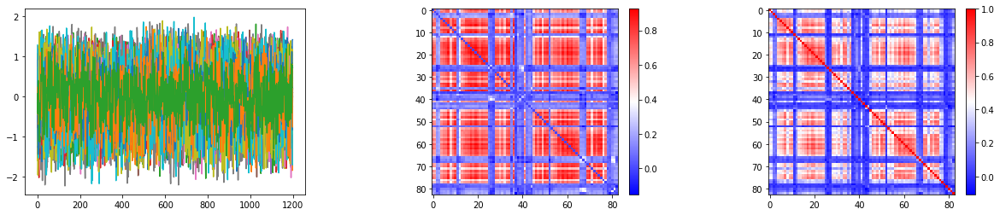

[0.100001, 0.4793799728155136, 0.8942566523551941, 0.9628450930118561, 20956.54734154311, 0.100001, 0.3117295026779175, 1.31370854473114, 0.9986628472805023, 20957.064186202195]
7 562446


<Figure size 432x288 with 0 Axes>

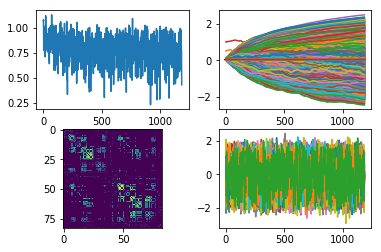

0.647959819211481


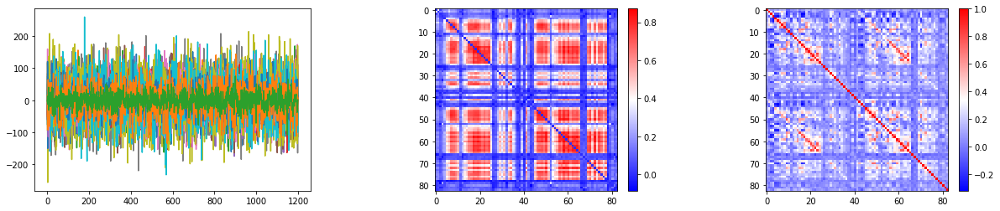

0.6503815779900195


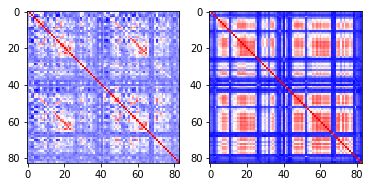

<Figure size 432x288 with 0 Axes>

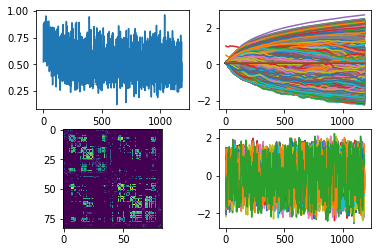

0.9723805282897211


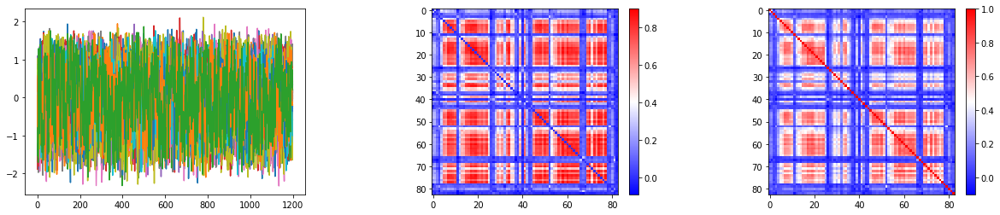

[0.6201821625232696, 0.5674938470125198, 1.475775767326355, 1.4143321871757508, 20939.486013986472, 0.4271882057189942, 0.5339023143053054, 1.6892597446441648, 0.599814510345459, 20957.55138234196]
8 200210
9 151223
10 872158
11 579665


<Figure size 432x288 with 0 Axes>

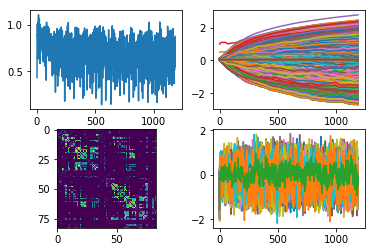

0.8084013506465795


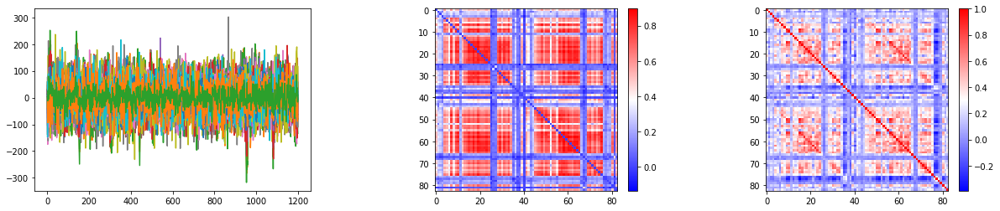

0.8318533067065046


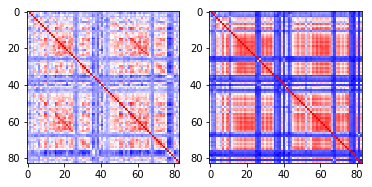

<Figure size 432x288 with 0 Axes>

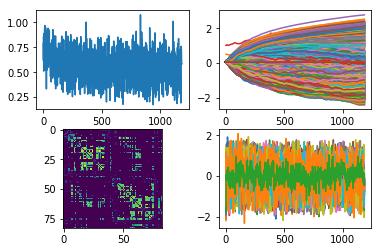

0.9643881908995933


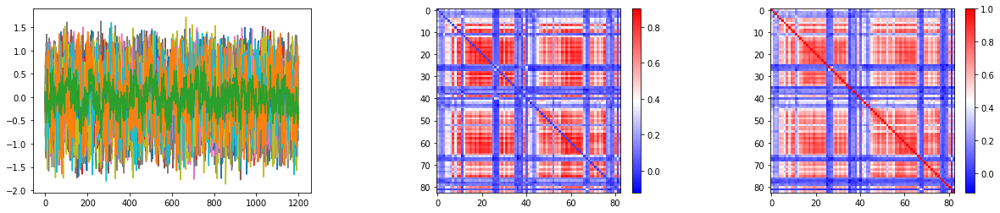

[0.100001, 0.3394233450293541, 0.953500069141388, 1.2309178113937378, 20963.994756285825, 0.8254626631736756, 0.39536846876144405, 1.3195593128204344, 1.6984182119369509, 20962.37483771021]
12 548250


<Figure size 432x288 with 0 Axes>

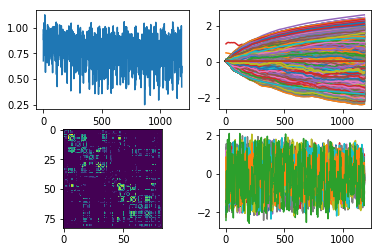

0.6814708069120459


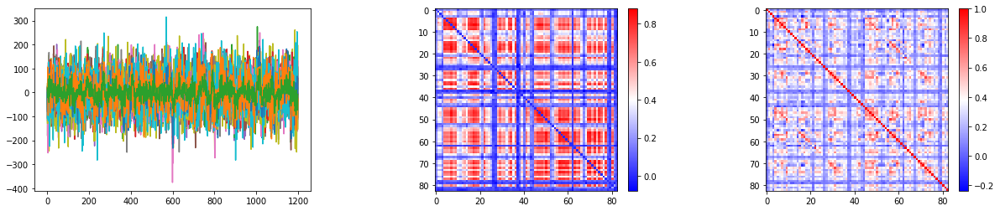

0.6871017480425902


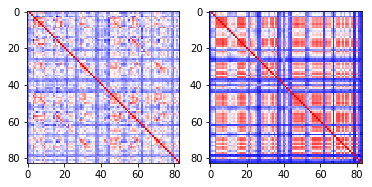

<Figure size 432x288 with 0 Axes>

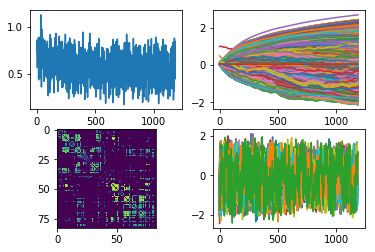

0.9533674777922403


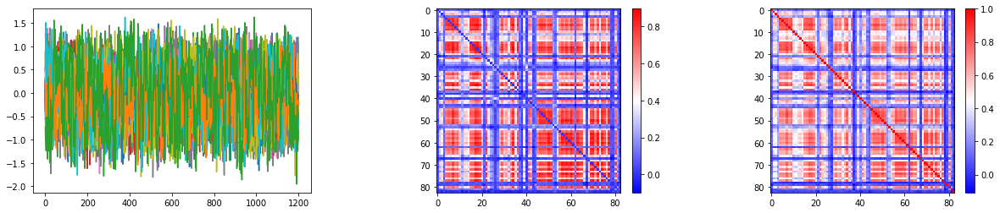

[0.520691379904747, 0.3105799585580826, 1.2511358985900878, 0.9720240890979767, 20952.520845706043, 0.6541099727153777, 0.38796265125274654, 1.0035584816932677, 0.7772066116333007, 20956.966870621363]
13 198350


<Figure size 432x288 with 0 Axes>

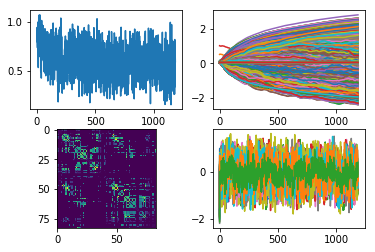

0.8889704491870395


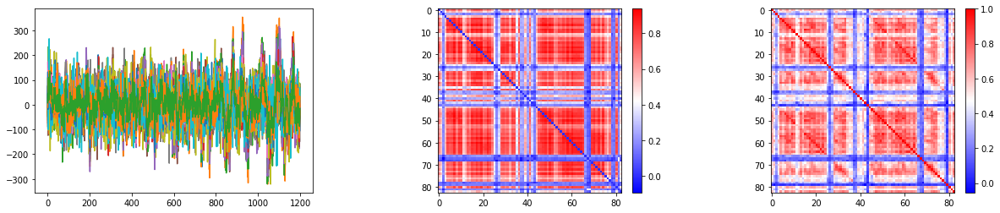

0.8908486635203592


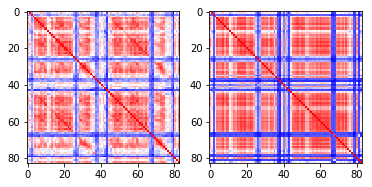

<Figure size 432x288 with 0 Axes>

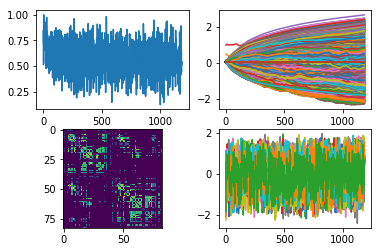

0.95422026553694


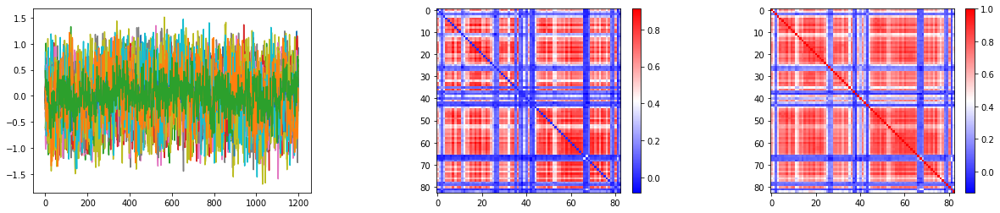

[0.8063601672649383, 0.23849642872810364, 1.3609485754966735, 1.1226234793663026, 20963.915970196347, 0.100001, 0.4036391168832779, 0.897060049533844, 1.0295991122722625, 20955.817534296224]
14 297655


<Figure size 432x288 with 0 Axes>

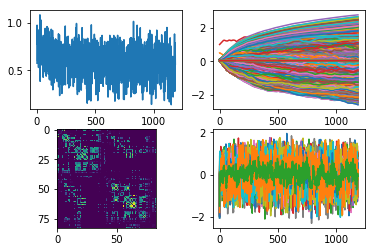

0.9041883347445487


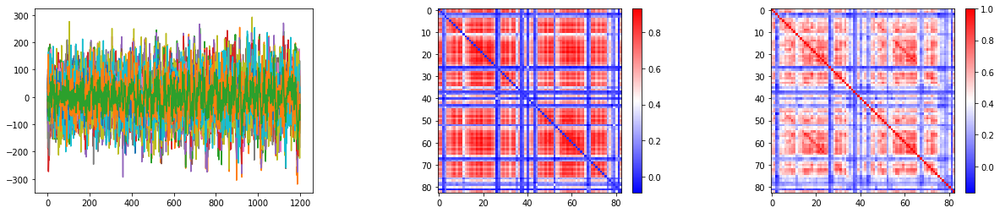

0.9052928897569094


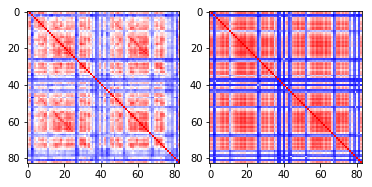

<Figure size 432x288 with 0 Axes>

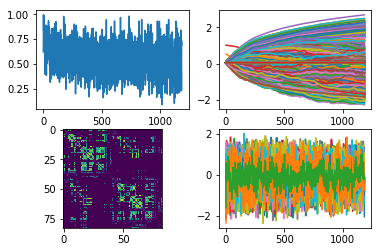

0.9792214917999374


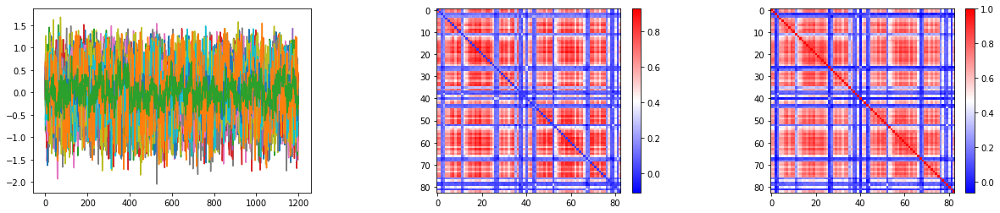

[1.0093097150325776, 0.3208448320627213, 0.9926112124919891, 1.9569043874740601, 20962.939275370354, 0.100001, 0.3780759602785111, 1.7543450365066526, 0.8275658249855041, 20957.923000763134]
15 295146


<Figure size 432x288 with 0 Axes>

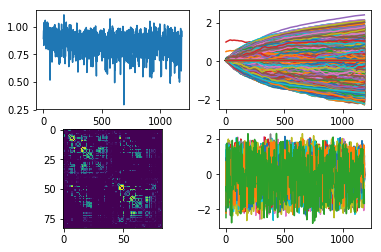

0.5040790260489819


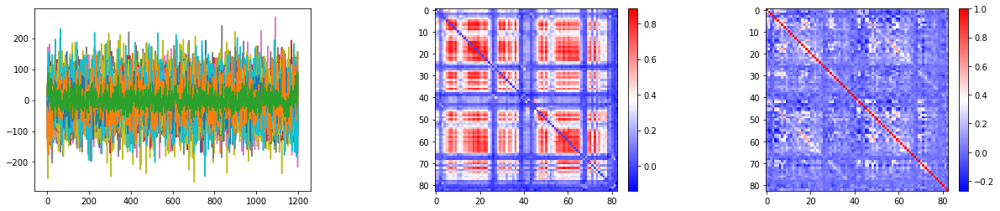

0.5011765571304944


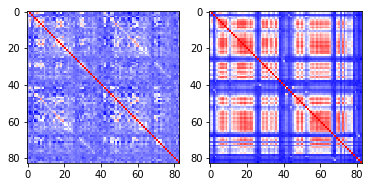

<Figure size 432x288 with 0 Axes>

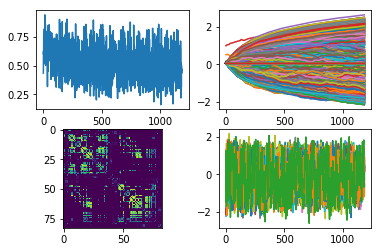

0.9604572723817056


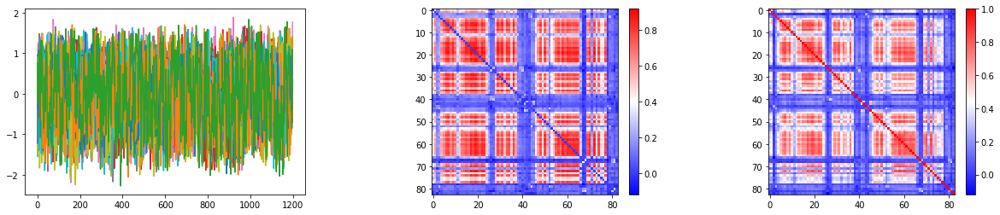

[0.6433976411819458, 0.4566674798727035, 1.4474634895324705, 1.1648654103279115, 20931.63349931322, 0.100001, 0.39772372841835024, 1.6246612200736998, 1.6637175202369692, 20953.73820257598]
16 561444
17 183337


<Figure size 432x288 with 0 Axes>

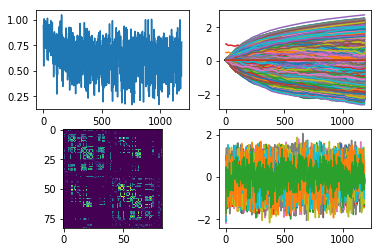

0.8481625025798727


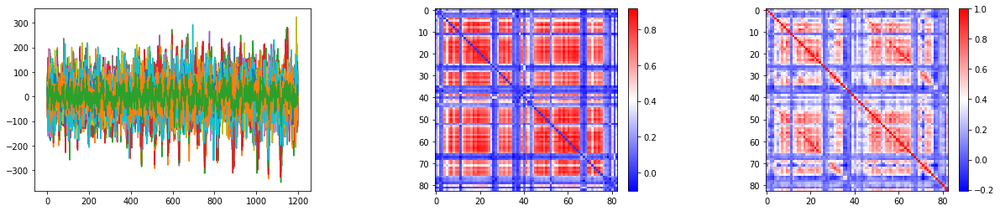

0.8534013029468248


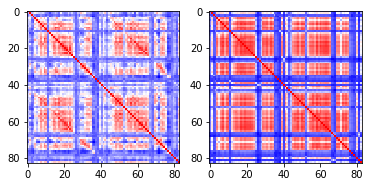

<Figure size 432x288 with 0 Axes>

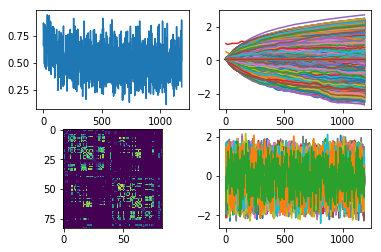

0.9751111207699794


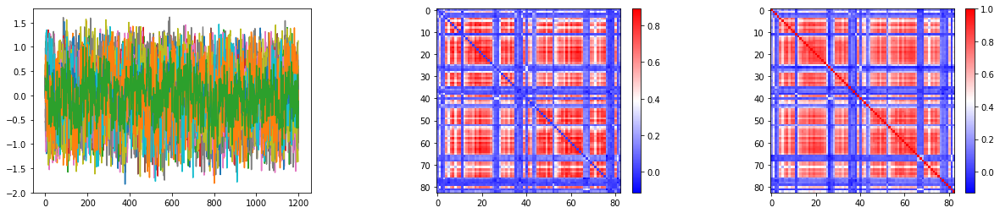

[0.5486951351165772, 0.32068231552839277, 1.8091062674522398, 1.431294345855713, 20960.47857432058, 0.7322039842605591, 0.488494622707367, 1.6705032358169554, 1.9447723507881165, 20958.719652664244]
18 559053


<Figure size 432x288 with 0 Axes>

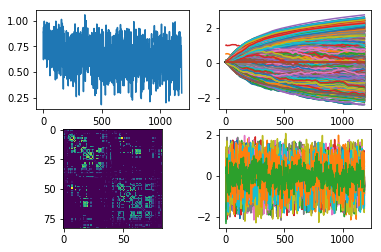

0.804524510122617


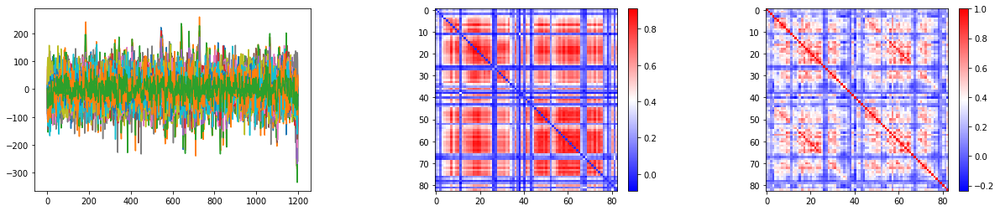

0.8007657542607793


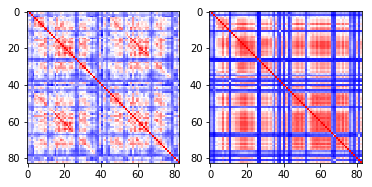

<Figure size 432x288 with 0 Axes>

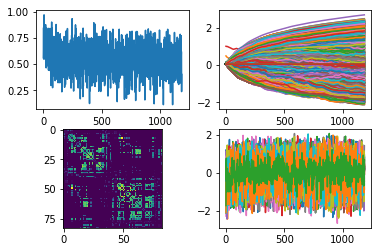

0.9743085394780886


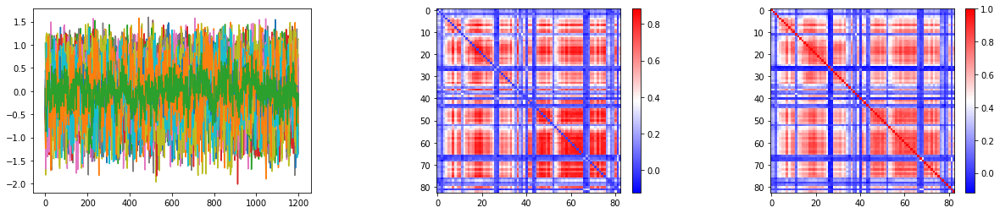

[0.40511128306388855, 0.3600471287965774, 1.621568025112152, 0.7389334261417388, 20960.636174034913, 0.100001, 0.4420059442520141, 1.3208681354522704, 0.7278688549995422, 20957.78134923628]
19 519950


<Figure size 432x288 with 0 Axes>

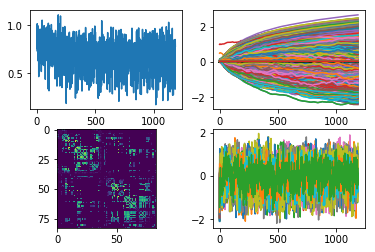

0.7399331763965055


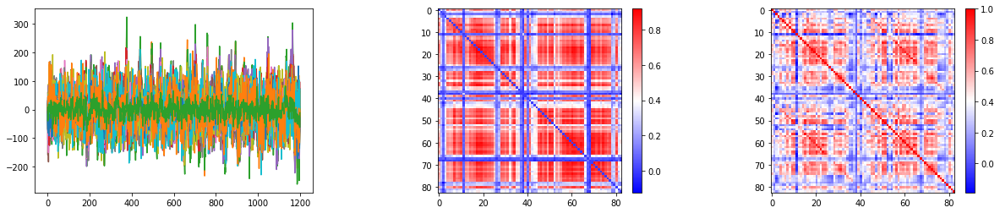

0.7531088389008191


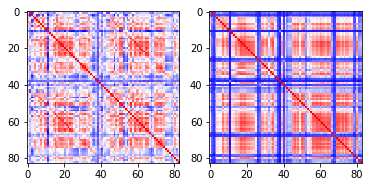

<Figure size 432x288 with 0 Axes>

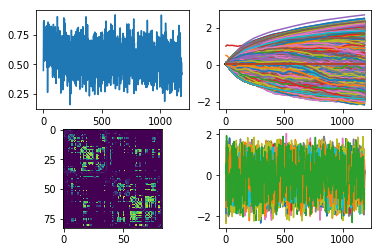

0.9592014920713838


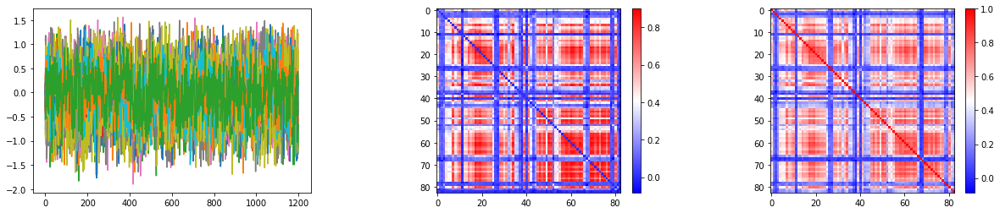

[1.3361943006515504, 0.32981994450092317, 1.5944366583824157, 1.6106226086616517, 20956.66939802348, 0.9193293392658234, 0.4241135507822037, 1.6584490547180175, 1.6293665409088136, 20957.353018199043]
20 220721
21 197550


<Figure size 432x288 with 0 Axes>

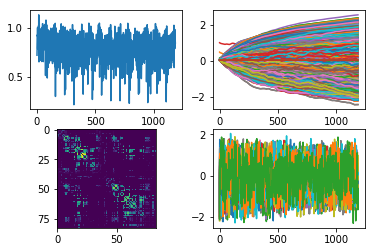

0.5858208415692114


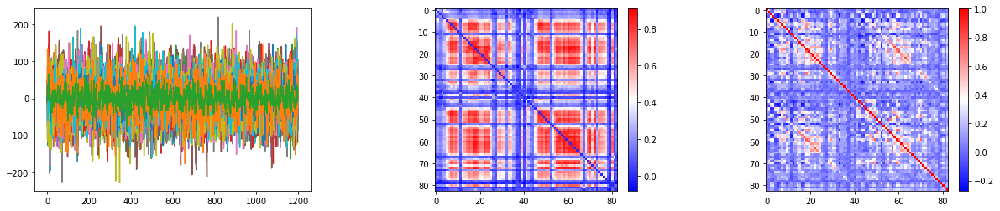

0.5950862247439019


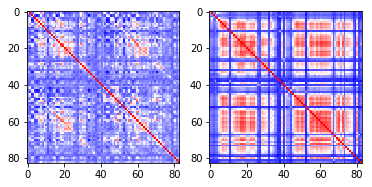

<Figure size 432x288 with 0 Axes>

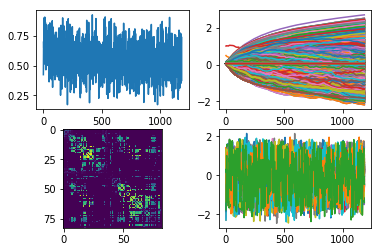

0.9593077467184877


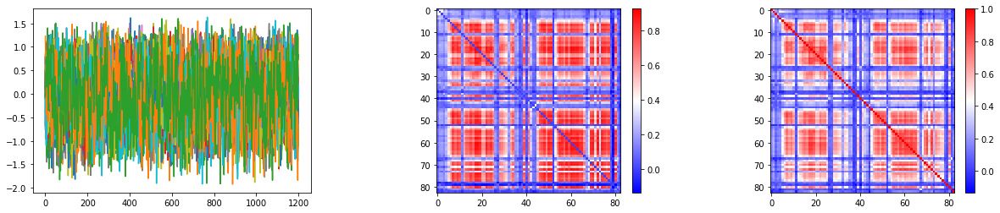

[0.100001, 0.3463213488459587, 1.6473282585144042, 1.0021391332149505, 20946.059479136453, 1.125255572795868, 0.41401903629302983, 1.487650490760803, 1.4130942463874818, 20958.724517420964]
22 179952


<Figure size 432x288 with 0 Axes>

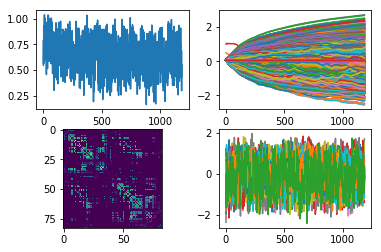

0.8405311105220747


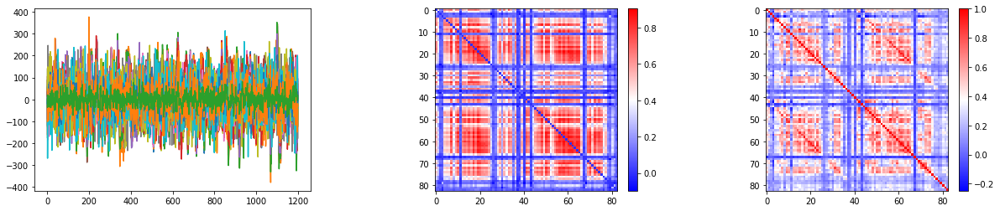

0.8348583387033311


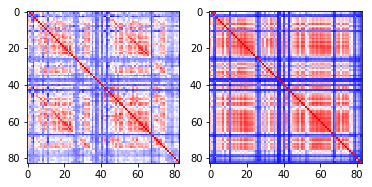

<Figure size 432x288 with 0 Axes>

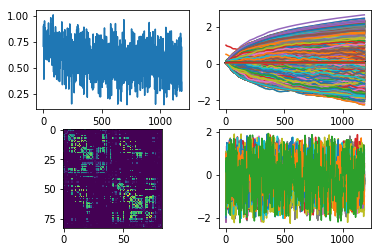

0.968203991856502


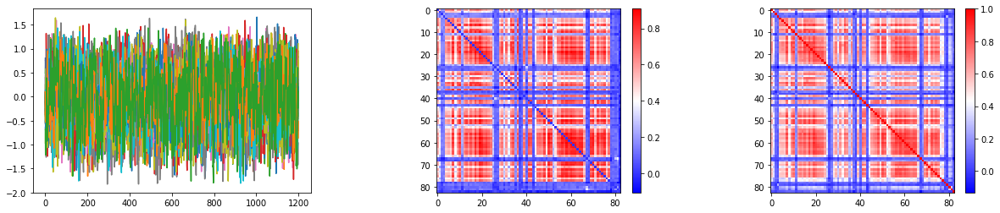

[0.3836635142564774, 0.3175929233431816, 1.5169862756729124, 0.5347210168838501, 20958.94981097252, 0.2571186438202858, 0.37955601215362544, 1.932514847278595, 0.9474321722984314, 20955.429686554326]
23 151526


<Figure size 432x288 with 0 Axes>

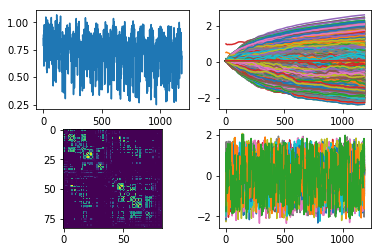

0.6368772960982151


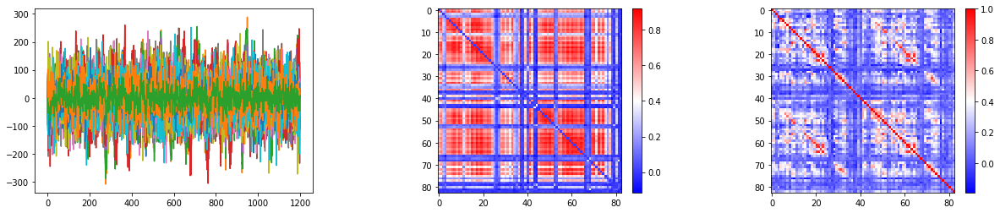

0.6464319740193362


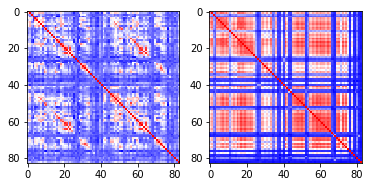

<Figure size 432x288 with 0 Axes>

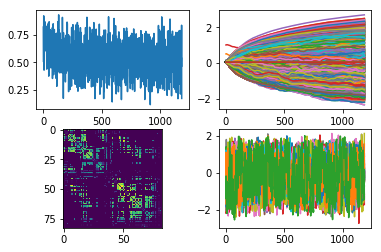

0.9750310882083344


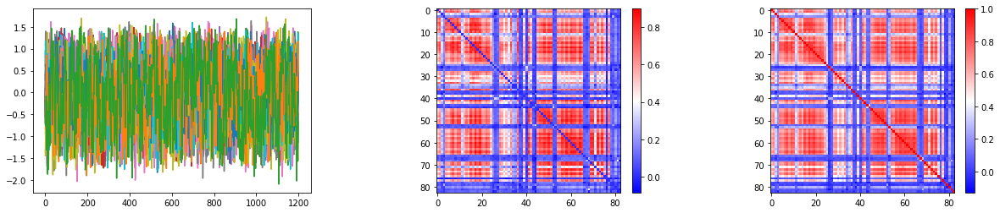

[0.2782373145222664, 0.3648659765720368, 1.2010185847282409, 0.9539726614952088, 20950.65037445938, 0.433472391963005, 0.46346913576126103, 1.6153436431884765, 1.2256147623062135, 20957.518184226363]
24 191033
25 177342


<Figure size 432x288 with 0 Axes>

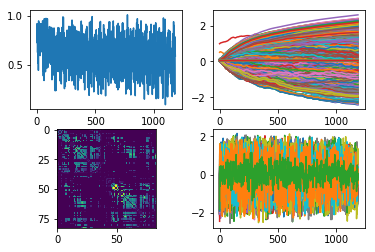

0.8336866587861985


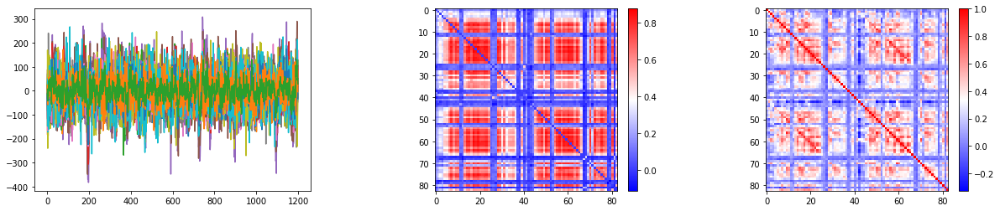

0.8413409449047679


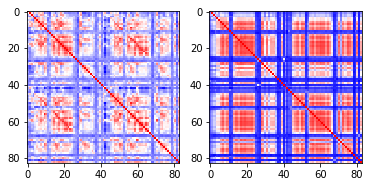

<Figure size 432x288 with 0 Axes>

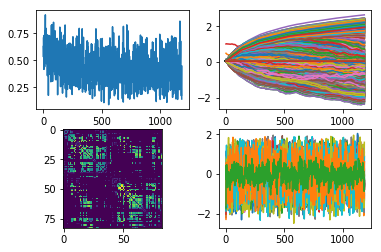

0.9750657531022784


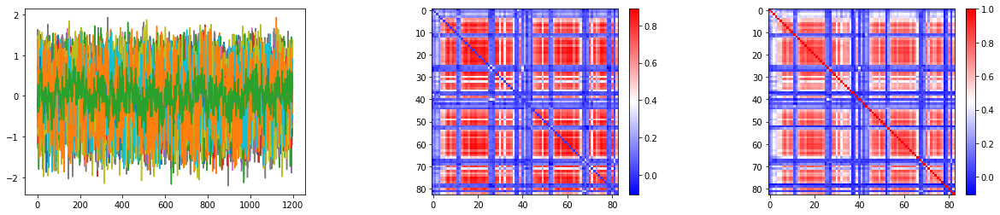

[0.40009977221488957, 0.45344720780849457, 1.1148978123664854, 1.8738583445549013, 20950.16669200969, 0.843669432401657, 0.4116369962692261, 1.370804549217224, 1.3825047969818116, 20953.425305901703]
26 156536
27 298051


<Figure size 432x288 with 0 Axes>

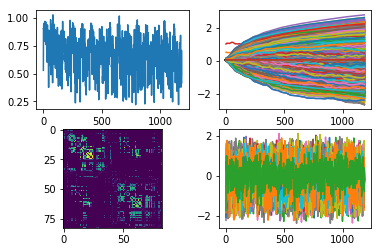

0.859949358515281


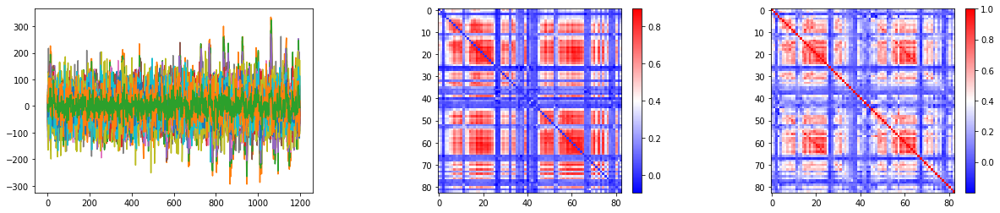

0.8730736774667638


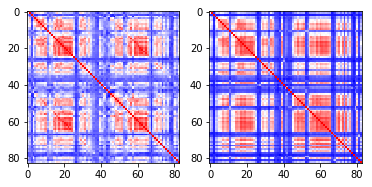

<Figure size 432x288 with 0 Axes>

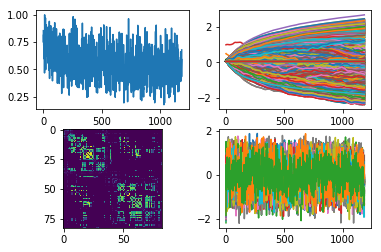

0.9661130617255874


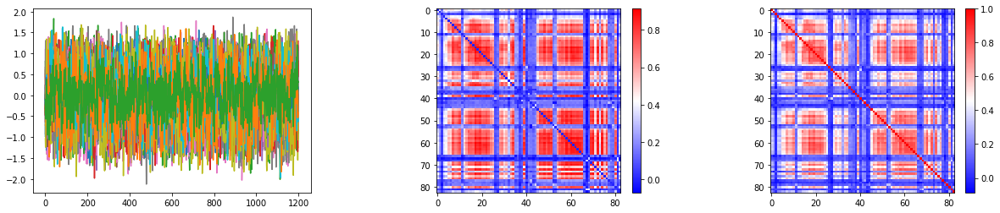

[0.100001, 0.41326847374439235, 1.581913984775543, 1.1755213618278504, 20962.679563098325, 0.5214866578578949, 0.35310674607753756, 1.430387855529785, 1.1658156275749207, 20956.931564007282]
28 570243
29 154229


<Figure size 432x288 with 0 Axes>

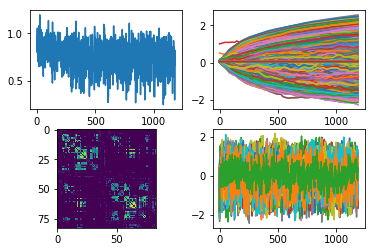

0.6568680827022957


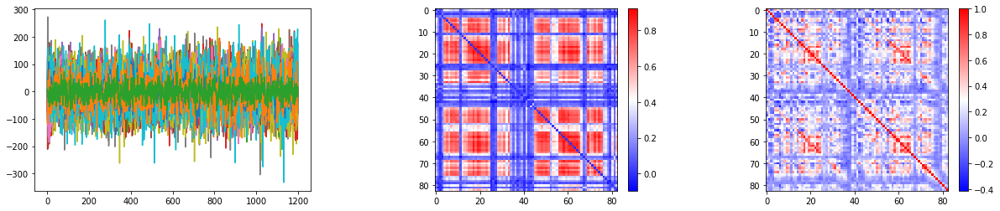

0.6614288369955356


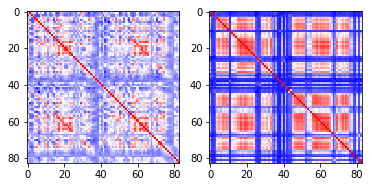

<Figure size 432x288 with 0 Axes>

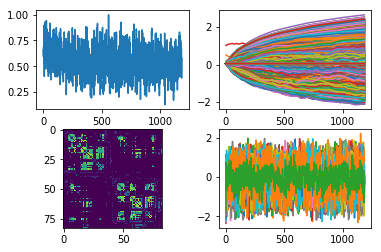

0.9630598370493734


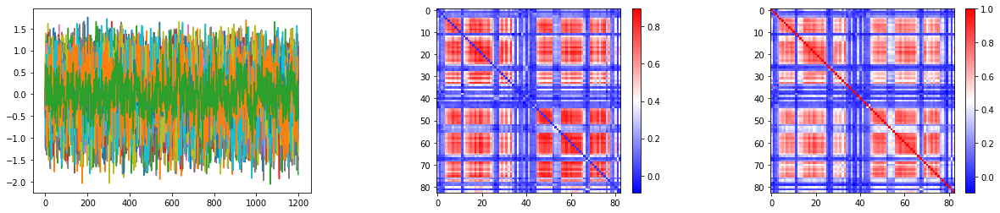

[0.9490502536296844, 0.4168216466903687, 1.3077161321640014, 1.2719857811927797, 20946.211012945085, 0.100001, 0.4868346571922302, 1.7957568297386168, 1.3343842148780825, 20953.801227315264]
30 512835


<Figure size 432x288 with 0 Axes>

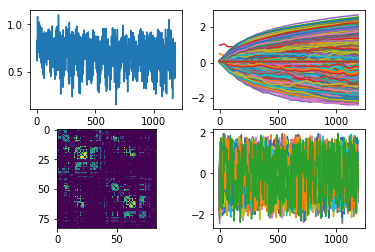

0.8186407966178174


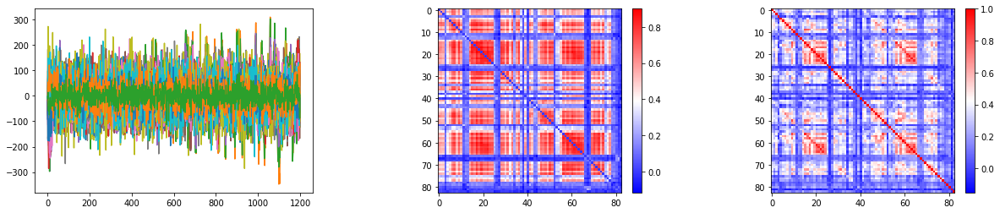

0.8310020506258474


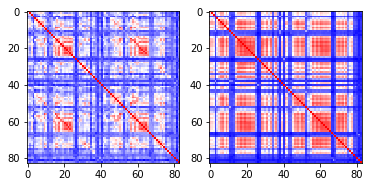

<Figure size 432x288 with 0 Axes>

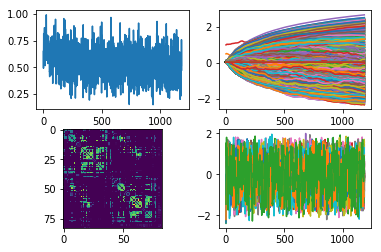

0.9699994565433253


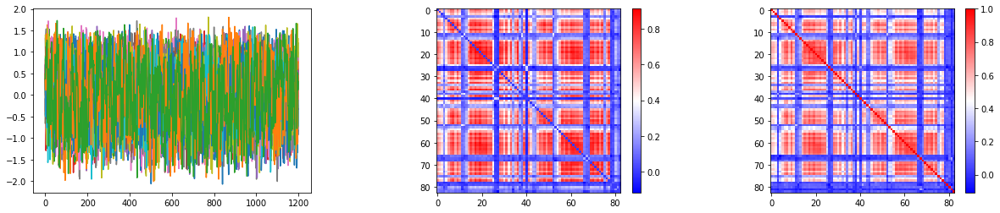

[0.7380864202976226, 0.40803291499614713, 1.224306155204773, 0.8654559731483459, 20957.433650718955, 1.5072002530097963, 0.37608342468738554, 1.719111479282379, 1.7100991487503052, 20956.9169867744]
31 257542


<Figure size 432x288 with 0 Axes>

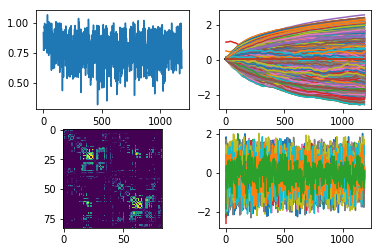

0.5983098737976411


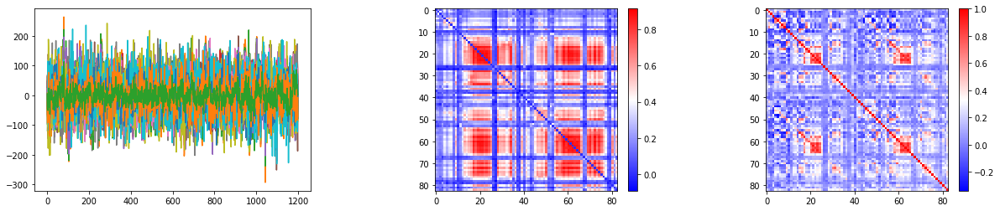

0.5996921278816568


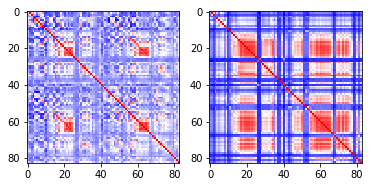

<Figure size 432x288 with 0 Axes>

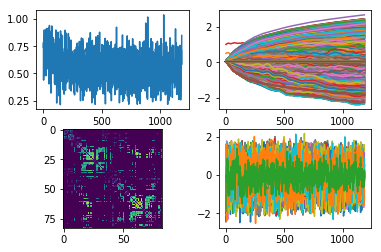

0.9633468674978195


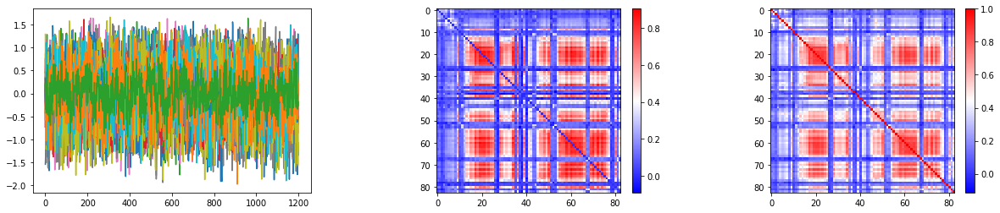

[0.100001, 0.3860279083251953, 1.4824029097557068, 0.6816789507865906, 20946.2122488536, 0.100001, 0.4127096593379974, 1.686518479347229, 1.0074666380882265, 20956.776765055667]
32 529549


<Figure size 432x288 with 0 Axes>

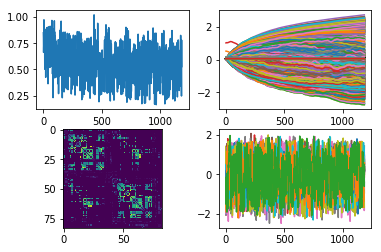

0.8550161729215499


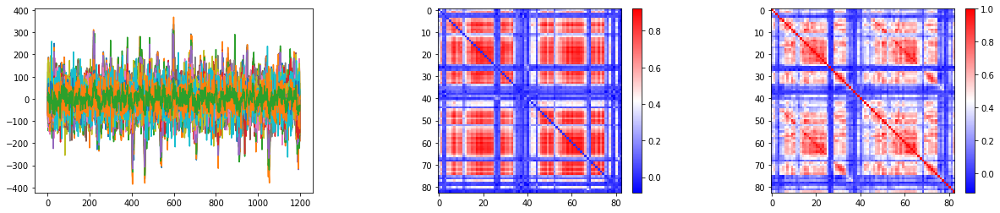

0.8720930038874587


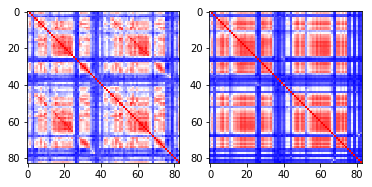

<Figure size 432x288 with 0 Axes>

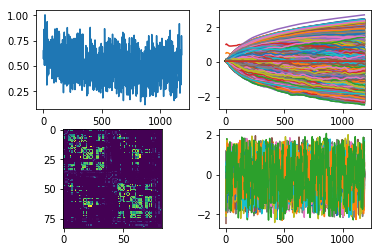

0.9629276644496287


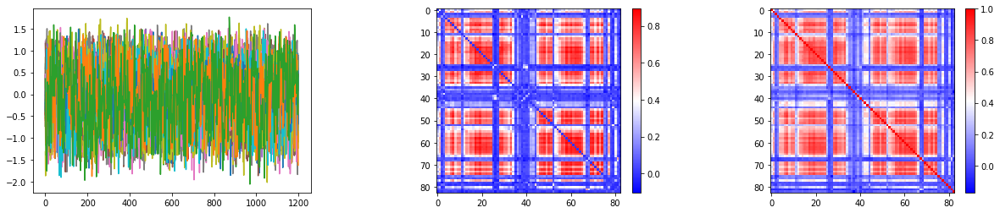

[0.9028984129428863, 0.3653908342123031, 1.3148041377067565, 1.5632023930549623, 20959.10942845373, 0.3972325325012207, 0.44517981112003324, 1.9191027889251708, 1.287965989112854, 20958.407146320384]
33 173738


<Figure size 432x288 with 0 Axes>

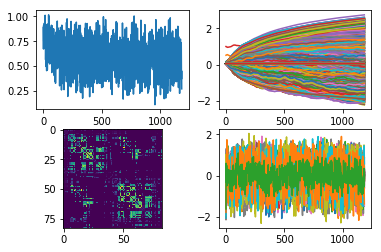

0.8777775566486006


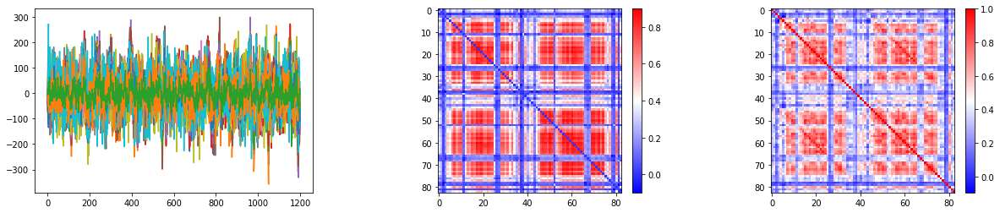

0.8776643074440907


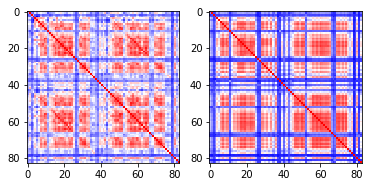

<Figure size 432x288 with 0 Axes>

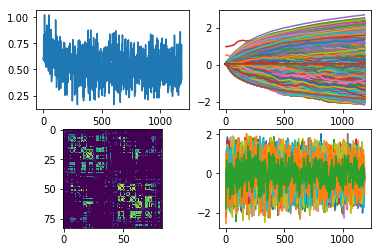

0.962335251683776


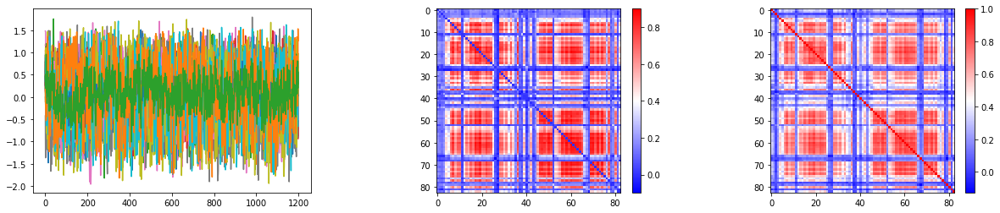

[0.4721393764019013, 0.39323334991931913, 1.1122684607505797, 1.3429139375686647, 20960.327865820254, 0.48106135129928584, 0.362728887796402, 1.7493669877052307, 1.0779363155364992, 20958.2375690595]
34 214423
35 177746


<Figure size 432x288 with 0 Axes>

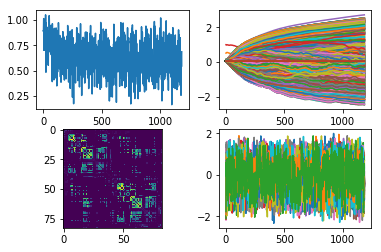

0.8119465132347752


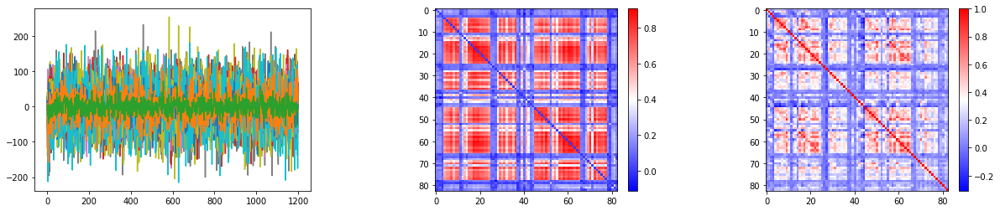

0.8253048141207459


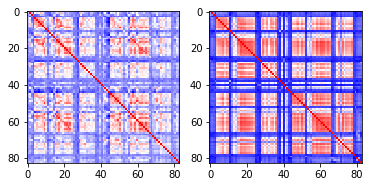

<Figure size 432x288 with 0 Axes>

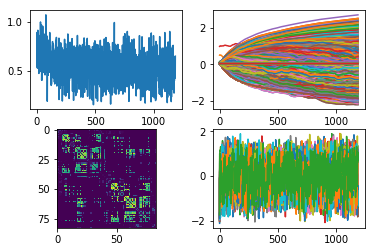

0.9720590036576916


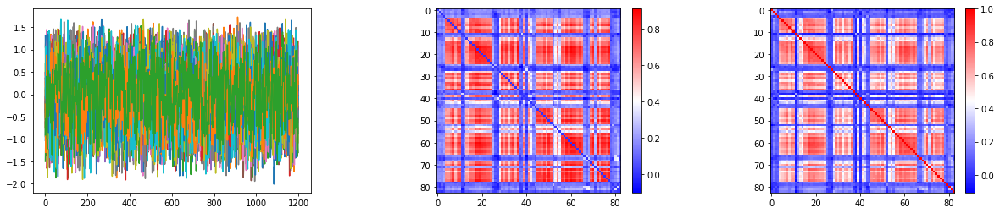

[0.100001, 0.4163544625043869, 1.3744675168991087, 1.527061402797699, 20959.26312245006, 0.5865331381559372, 0.4115707725286484, 2.070098401069641, 1.3545634627342225, 20958.64368773355]
36 171532


<Figure size 432x288 with 0 Axes>

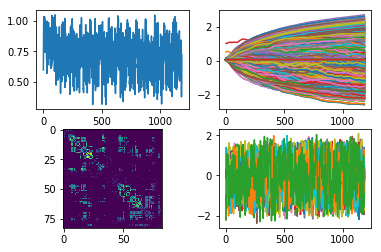

0.7416363111885351


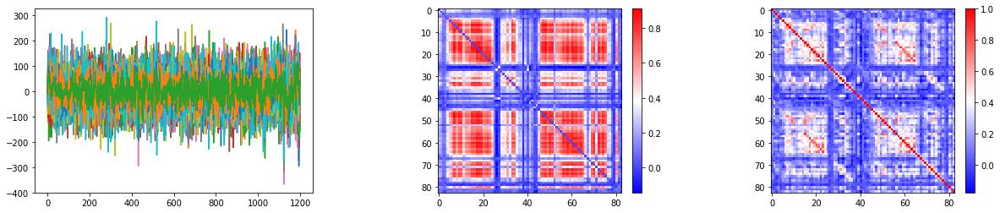

0.7482559059960556


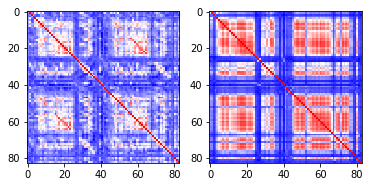

<Figure size 432x288 with 0 Axes>

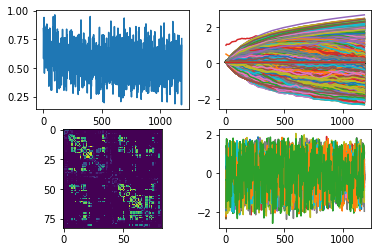

0.9657629806676842


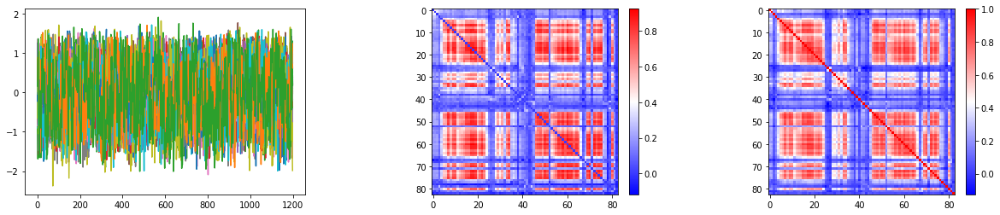

[0.100001, 0.40486229956150055, 1.5828851947784424, 1.3699414491653443, 20956.694637843248, 0.100001, 0.3784270793199539, 2.0686567792892454, 1.3865694403648376, 20958.50260875668]
37 480141


<Figure size 432x288 with 0 Axes>

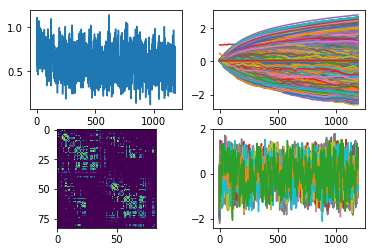

0.8332773438466268


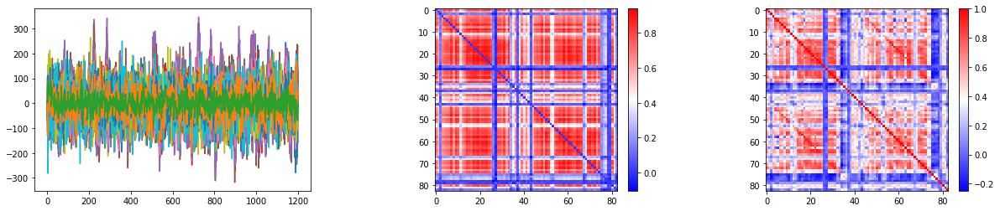

0.8440642036771348


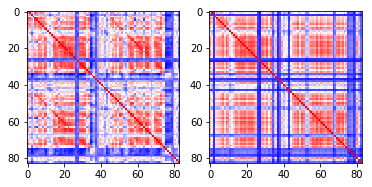

<Figure size 432x288 with 0 Axes>

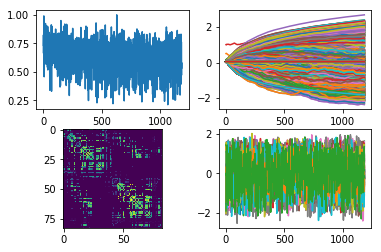

0.9443160392798093


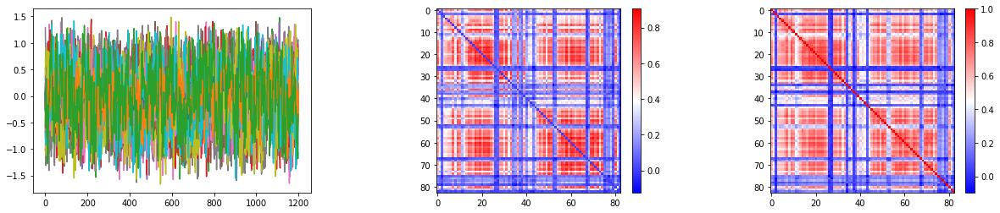

[0.100001, 0.26651741564273834, 0.8917438516616821, 1.217069435119629, 20964.55954441654, 0.7178415536880492, 0.45574683845043185, 1.7476142296791075, 1.2051723003387451, 20957.59076934707]
38 285446


<Figure size 432x288 with 0 Axes>

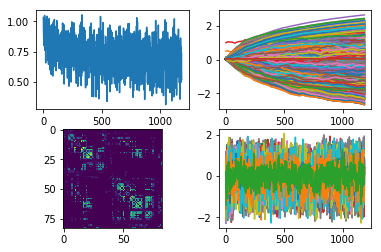

0.7226761259917623


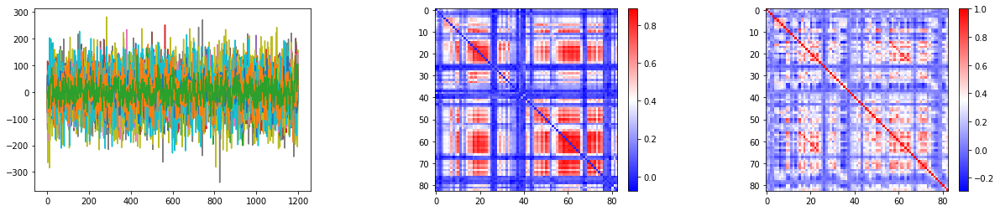

0.7371719152341799


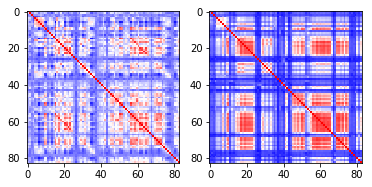

<Figure size 432x288 with 0 Axes>

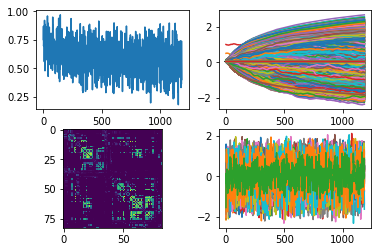

0.9678738005580066


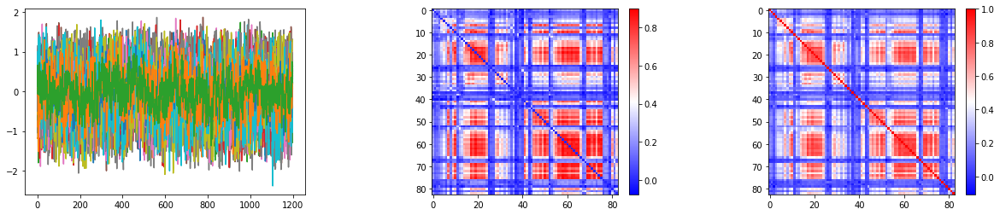

[0.100001, 0.4612463921308517, 1.4024435291290283, 1.0845591127872467, 20955.96810732297, 0.4411860167980194, 0.46884909868240354, 1.581978012084961, 1.5066631436347961, 20956.717668891375]
39 176441


<Figure size 432x288 with 0 Axes>

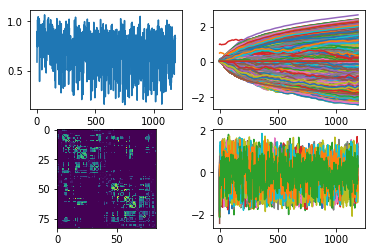

0.7699047959942548


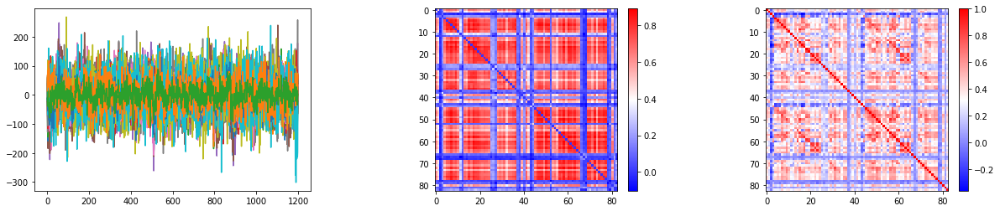

0.770076580595508


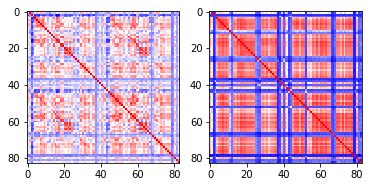

<Figure size 432x288 with 0 Axes>

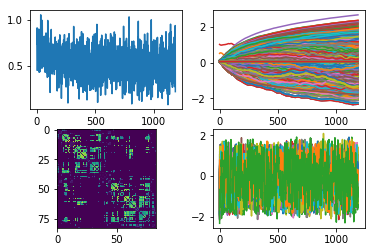

0.9688722151575296


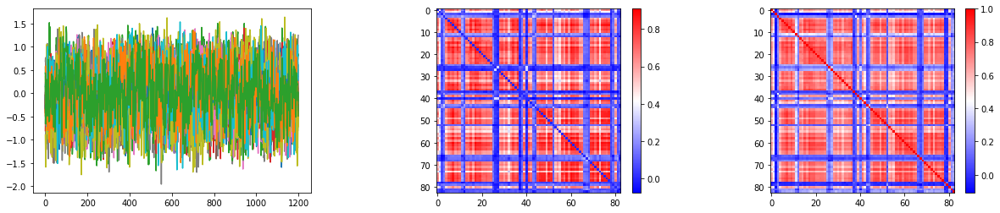

[0.100001, 0.3001378610730171, 1.3392533192634581, 1.2603991866111757, 20956.04025810582, 0.3410111740231514, 0.42300863265991206, 1.2980778584480284, 1.343946135044098, 20955.044623934984]
40 280941


<Figure size 432x288 with 0 Axes>

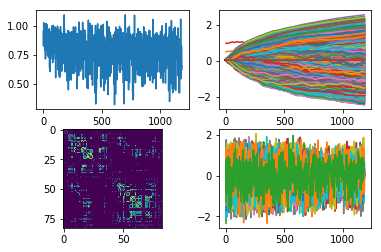

0.526145724536999


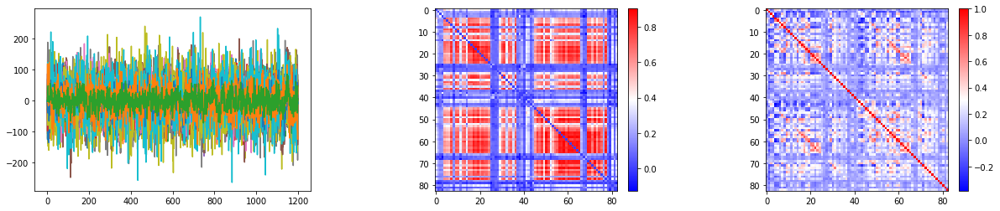

0.5374756019269832


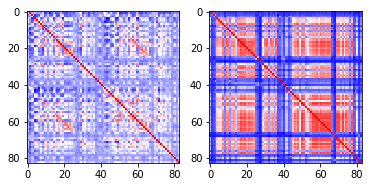

<Figure size 432x288 with 0 Axes>

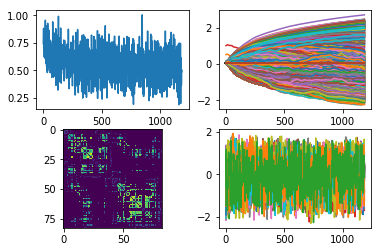

0.9667409878192571


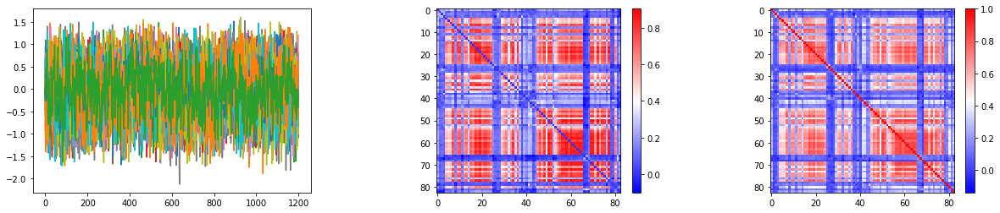

[0.7261634588241577, 0.33536673337221146, 2.2358679304122924, 1.33590167760849, 20947.41027255419, 0.100001, 0.3961500704288483, 1.6491207847595213, 1.1270840644836426, 20958.49562208062]
41 115017
42 156435


<Figure size 432x288 with 0 Axes>

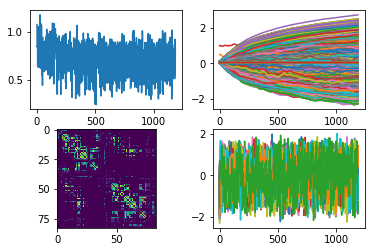

0.7789700079021523


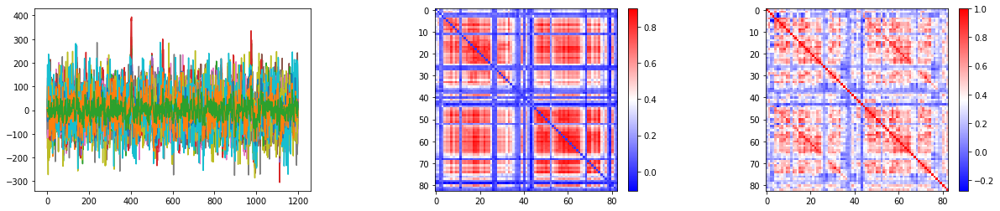

0.7731637803092305


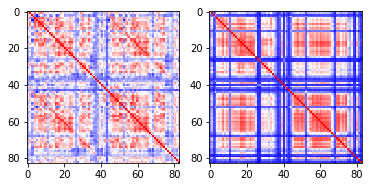

<Figure size 432x288 with 0 Axes>

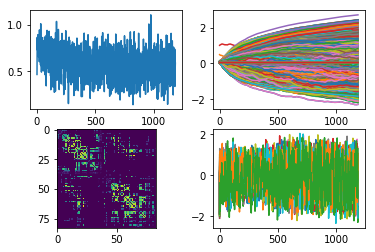

0.9731384302080205


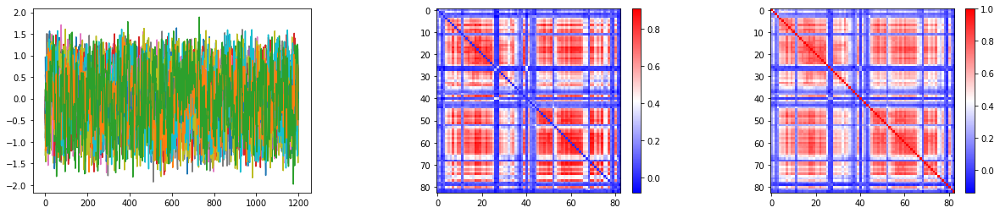

[0.729493361711502, 0.355823065340519, 1.6760707507133483, 1.1221276044845583, 20961.44534306845, 0.9492738544940948, 0.4182607471942902, 1.1778797397613525, 1.0646043717861176, 20958.34193008786]
43 965771
44 448347


<Figure size 432x288 with 0 Axes>

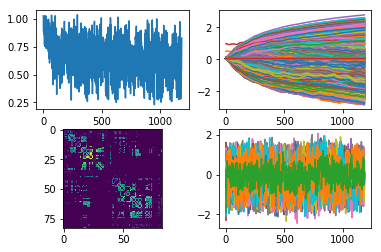

0.823976193648385


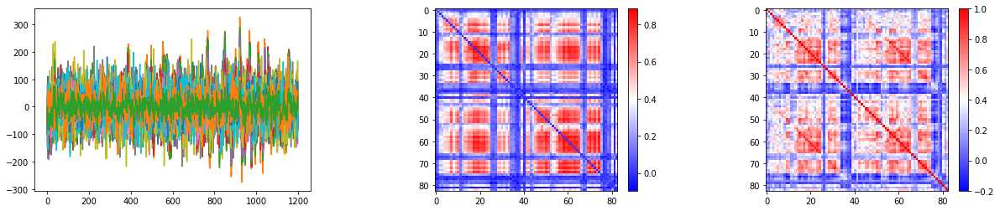

0.8464979450911452


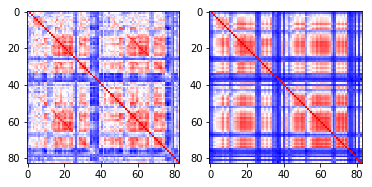

<Figure size 432x288 with 0 Axes>

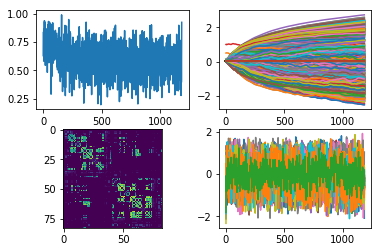

0.959863857890187


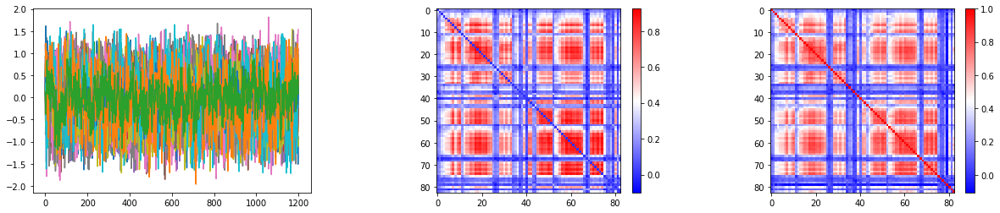

[0.100001, 0.3431043788790703, 1.2935330758094787, 1.6276703953742981, 20963.654532063916, 1.1675124168395996, 0.38710585832595823, 1.2734087715148925, 1.2654397249221803, 20960.296309694088]
45 173233
46 173536


<Figure size 432x288 with 0 Axes>

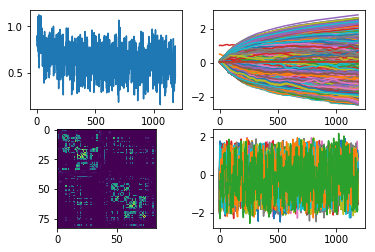

0.8187992199535866


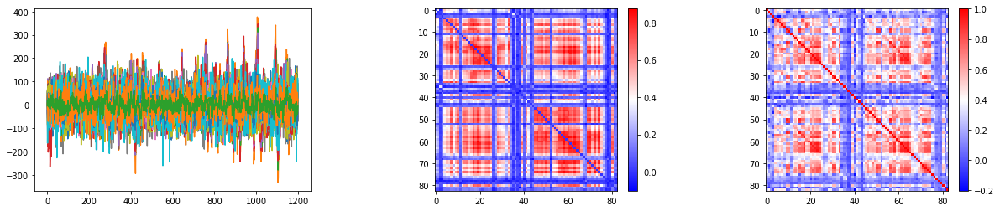

0.8191789016843907


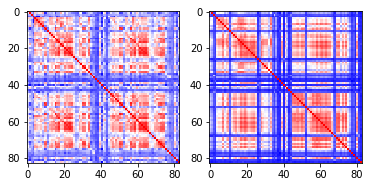

<Figure size 432x288 with 0 Axes>

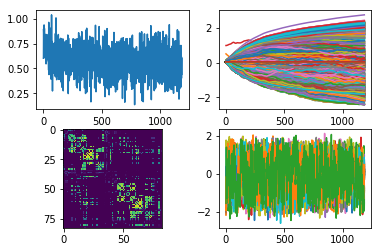

0.9642118455376311


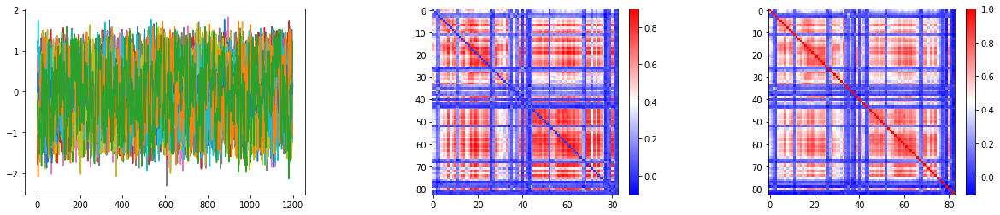

[0.100001, 0.40297152996063235, 1.6534916291236876, 1.4579845070838928, 20964.992759001132, 0.100001, 0.3957457780838013, 1.4168185839653014, 1.2921841740608215, 20961.78171889668]
47 904044
48 175035


<Figure size 432x288 with 0 Axes>

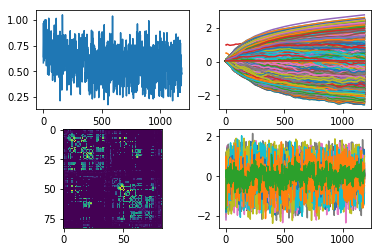

0.8478833026444259


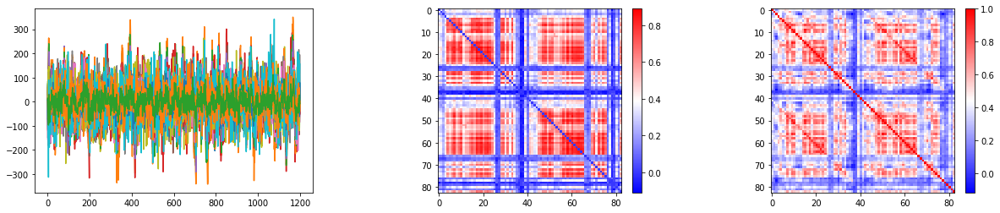

0.8485667014981386


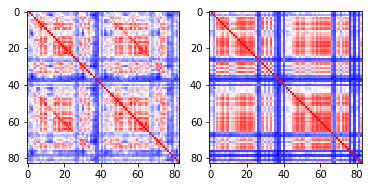

<Figure size 432x288 with 0 Axes>

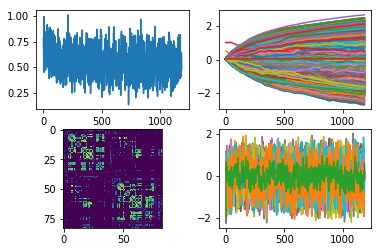

0.9610723544152858


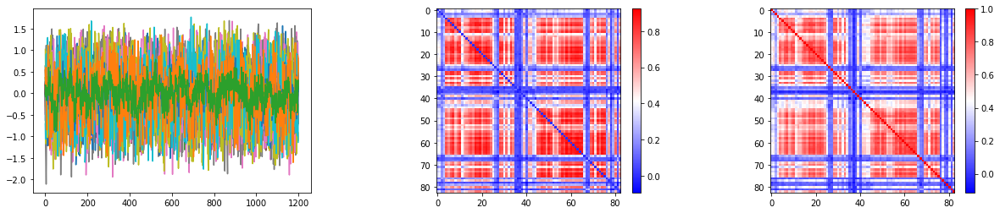

[0.8729982435703277, 0.3567339211702347, 1.4702670822143553, 1.2730315923690796, 20963.44285104377, 0.5161345809698105, 0.4104644030332565, 1.3648211607933043, 0.6820235550403595, 20955.825712500628]
49 150928


<Figure size 432x288 with 0 Axes>

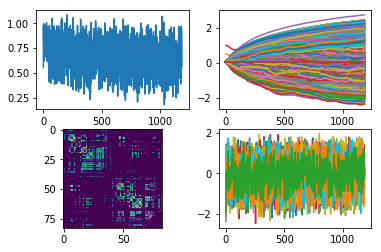

0.7411034337328077


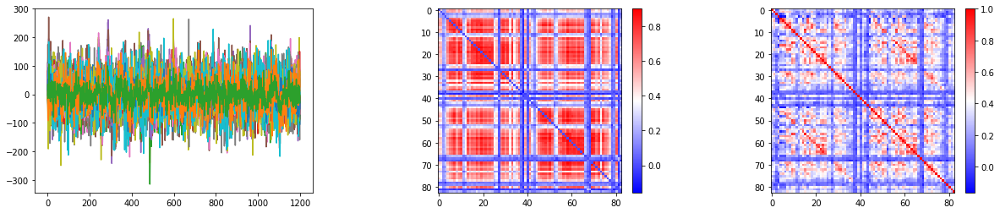

0.7544980637127312


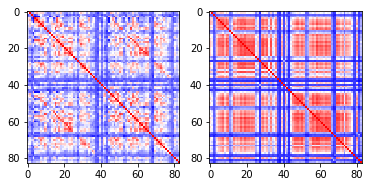

<Figure size 432x288 with 0 Axes>

KeyboardInterrupt: 

In [57]:
batch_size = 83
HCP_par_corr= {}
ROI_size = 83
#groups= ['CON_MCI']

subs=[sub for sub in os.listdir(SC_base_dir) if os.path.isdir(SC_base_dir+sub)]
subs = subs[20:100]
for i in range(len(subs)):
    sub =subs[i]
    print(i, sub)
    SC_file = SC_base_dir+ sub +'/dsi_sd4/sub-' +sub +'_roisc33dwispace/weights.txt'
    TS_file = TS_base_dir+sub+ '_rfMRI_REST1_LR_hpc200_clean__l2k8_sc33_ts.pkl'
#groups= ['CON_MCI']



    
    if os.path.isfile(SC_file) and os.path.isfile(TS_file):
        HCP_par_corr[sub] = []
        SC= np.loadtxt(SC_file)
        TS_df=pd.read_pickle(TS_file)
        TS=TS_df.values
        TS_dmean =(TS.T -TS.T.mean(axis= 0)).T
        SC = (SC+SC.T)*0.5
        """SC1=SC[:48,:48].copy()
        SC2=SC[48:96,48:96].copy()
        SC3=SC[:48,48:96].copy()
        mask1 = (SC1-SC1.mean(axis=1)< 2.*SC1.std(axis=1)) 
        SC1[mask1]=0
        SC2[(SC2-SC2.mean(axis=1) <  2*SC2.std(axis=1)) ]=0
        SC3[(SC3-SC3.mean(axis=1)<  2*SC3.std(axis=1)) ]=0
        SC[:48,:48] = SC1
        SC[48:96,48:96] = SC2
        SC[:48,48:96] = 1*SC3
        SC[48:96,:48] = 1*SC3.T"""
        Wo = np.log1p(SC)/np.linalg.norm(np.log1p(SC))
        #L_s = (-np.diag(np.sum(W0, axis= 1)) + W0).astype(np.float32)
            
            
        num_data = TS.shape[0]

        total_series_length = num_data -echo_step #50000


        num_batches = total_series_length//truncated_backprop_length
            
        model_run(sub,Wo, TS)
    
        X0 = np.ones((6*batch_size,))/10.
        params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_test_1.txt')
        Theta = params[-10:,:].mean(axis = 0)

        tys=[]
        ROI_size= batch_size
        for j in range(4000):
            X = f_diffusion_tr_noise(X0,Wo, Theta)
        
            X0 = X
    
            tys.append(h_diffusion_noise(X0, Theta))
        
        tys=np.array(tys)
        #tys_dmean =(tys.T -tys.T.mean(axis= 0)).T
        FC_sim = np.corrcoef(tys[20:,:].T)
        FC=np.corrcoef(TS.T)
        np.savetxt(out_dir+'HCP_'+sub+'sim_bold_test_1.txt', np.array(tys))
        print(np.corrcoef(FC[np.tril_indices(batch_size,-1)], FC_sim[np.tril_indices(batch_size,-1)])[0,1])
        #HCP_par_corr[sub].append(np.corrcoef(FC[np.tril_indices(batch_size,-1)], FC_sim[np.tril_indices(batch_size,-1)])[0,1])
            
    
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[0:1])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[1:2])[0])
        HCP_par_corr[sub].append(.001+ smooth_normalize(Theta[2:3])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[3:4])[0])
        HCP_par_corr[sub].append(5000./0.459/0.641+4000.*np.tanh(Theta[4:5])[0])
        
        
            
        fig, ax = plt.subplots(1,2)
        ax[0].imshow(FC, cmap='bwr')
        ax[1].imshow(FC_sim, cmap='bwr')
        plt.show()
        
        TS_file = out_dir+'HCP_'+sub+ 'sim_bold_test_1.txt'
        TS=np.loadtxt(TS_file)
        TS_dmean =(TS.T -TS.T.mean(axis= 0)).T
        TS=TS[-1200:,:]
        
        model_run(sub,Wo, TS)
        params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_test_1.txt')
        Theta = params[-10:,:].mean(axis = 0)
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[0:1])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[1:2])[0])
        HCP_par_corr[sub].append(.001+ smooth_normalize(Theta[2:3])[0])
        HCP_par_corr[sub].append(.1+ smooth_normalize(Theta[3:4])[0])
        HCP_par_corr[sub].append(5000./0.459/0.641+4000.*np.tanh(Theta[4:5])[0])
        print(HCP_par_corr[sub])

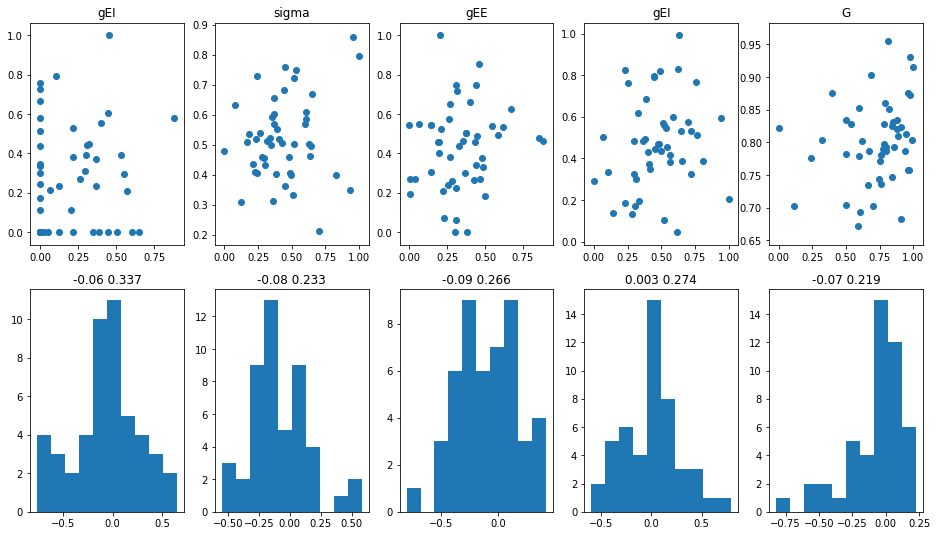

In [74]:
fig, ax=plt.subplots(2,5, figsize=(16,9))
titles=['gEI','sigma', 'gEE', 'gEI','G']
for i in range(5):
    x_lis=[]
    y_lis=[]
    for sub in HCP_par_corr:
        if len(HCP_par_corr[sub])>0 and len(HCP_par_corr[sub])==10:
            x_lis.append(HCP_par_corr[sub][i])
            y_lis.append(HCP_par_corr[sub][i+5])
        #print(np.corrcoef(np.array(x_lis), np.array(y_lis)))
    for sub in HCP_par_corr_new.item():
        if len(HCP_par_corr_new.item()[sub])>0:
            x_lis.append(HCP_par_corr_new.item()[sub][i])
            y_lis.append(HCP_par_corr_new.item()[sub][i+5])
    min_ls = min(min(x_lis), min(y_lis))
    max_ls = max(max(x_lis), max(y_lis))
    x_n=(x_lis-min_ls)/(max_ls-min_ls)
    y_n=(y_lis-min_ls)/(max_ls-min_ls)
   
    ax[0,i].scatter(np.array(x_n), np.array(y_n))
    ax[0,i].set_title(titles[i])
    ax[1,i].hist(np.array(x_n)- np.array(y_n))
    #slope, intercept, r_value, p_value, std_err = stats.linregress(np.array(x_lis)[mask], np.array(y_lis)[mask])
    diff_mean=(np.array(x_n)- np.array(y_n)).mean()
    diff_std=(np.array(x_n)- np.array(y_n)).std()
    ax[1,i].set_title(str(diff_mean)[:5] +' ' +str(diff_std)[:5])
plt.show()

In [61]:
y_list

NameError: name 'y_list' is not defined

IndexError: list index out of range

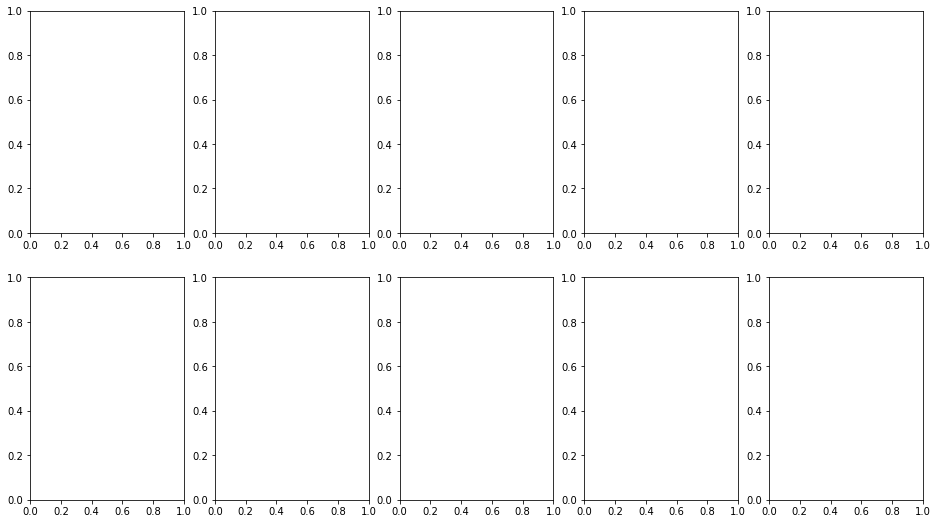

In [73]:
fig, ax=plt.subplots(2,5, figsize=(16,9))
titles=['gEI','sigma', 'gEE', 'gEI','G']
for i in range(5):
    x_lis=[]
    y_lis=[]
    for sub in HCP_par_corr:
        if len(HCP_par_corr[sub])>0:
            x_lis.append(HCP_par_corr[sub][i])
            y_lis.append(HCP_par_corr[sub][i+5])
        #print(np.corrcoef(np.array(x_lis), np.array(y_lis)))
    
    
    mask=(np.array(x_lis)>np.array(x_lis).mean()-3.1*np.array(x_lis).std()) & \
    (np.array(x_lis)<np.array(x_lis).mean()+3.1*np.array(x_lis).std()) &\
    (np.array(y_lis)>np.array(y_lis).mean()-3.1*np.array(y_lis).std()) & \
    (np.array(y_lis)<np.array(y_lis).mean()+3.1*np.array(y_lis).std())
    ax[0,i].scatter(np.array(x_lis)[mask], np.array(y_lis)[mask])
    ax[0,i].set_title(titles[i])
    ax[1,i].hist(np.array(x_lis)- np.array(y_lis))
    #slope, intercept, r_value, p_value, std_err = stats.linregress(np.array(x_lis)[mask], np.array(y_lis)[mask])
    diff_mean=(np.array(x_lis)- np.array(y_lis)).mean()
    diff_std=(np.array(x_lis)- np.array(y_lis)).std()
    ax[1,i].set_title(str(diff_mean)[:5] +' ' +str(diff_std)[:5])
plt.show()

In [ ]:
HCP_par_corr_new={}
for sub in HCP_par_corr:
    HCP_par_corr_new['sub'+sub] = HCP_par_corr[sub]

In [66]:
np.save(out_dir+'HCP_par_corr_50.npy', HCP_par_corr)

In [67]:
HCP_par_corr_new=np.load(out_dir+'HCP_par_corr_20.npy')

In [72]:
HCP_par_corr_new.item()

{'100307': [0.6634154677391052,
  0.3694640100002289,
  1.194964123725891,
  1.3019155621528626,
  20953.122484287145,
  0.880736792087555,
  0.37708126604557035,
  1.5250808606147765,
  1.1800732851028444,
  20961.30978925563],
 '148941': [0.2489000529050827,
  0.4601497679948807,
  1.2367007980346678,
  1.4228959560394288,
  20949.846249785245,
  1.2162564516067507,
  0.4088616013526917,
  1.2245302448272704,
  1.7136117935180666,
  20959.435036414707],
 '154532': [0.5119608551263809,
  0.420372661948204,
  1.615303660392761,
  1.049278438091278,
  20955.66039719204,
  0.5389260917901992,
  0.49587081074714656,
  2.2420323858261106,
  1.2223737835884094,
  20956.344803605465],
 '172332': [0.100001,
  0.447893100976944,
  1.948947573661804,
  0.6305131316184998,
  20958.20526192304,
  1.0354521930217744,
  0.4402364075183869,
  1.8741901884078978,
  1.2471978902816774,
  20959.344614803907],
 '173637': [0.17062013670802118,
  0.3624131113290787,
  1.1207086215019224,
  1.2194090247154

In [22]:
sub='172332'
params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_sim.txt')
Theta = params[-10:,:].mean(axis = 0)
Theta[:5]

array([ 2.17089028, -0.02761241,  2.22241683,  2.00951643, -1.45977468])

In [23]:
sub='172332'
params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_test.txt')
Theta_1 = params[-10:,:].mean(axis = 0)

In [24]:
Theta_1[:5]

array([ 1.5026439 , -0.06648448,  1.72294374,  0.95050476, -0.76854359])

In [25]:
print(.1+ smooth_normalize(Theta[0:1])[0])
print(.001+ smooth_normalize(Theta[1:2])[0])
print(.1+ smooth_normalize(Theta[2:3])[0])
print(5000./0.459/0.641+4000.*np.tanh(Theta[3:4])[0])

2.270890283584595
0.001001
2.3224168300628665
20852.91898481734


In [26]:
print(.1+ smooth_normalize(Theta_1[0:1])[0])
print(.001+ smooth_normalize(Theta_1[1:2])[0])
print(.1+ smooth_normalize(Theta_1[2:3])[0])
print(5000./0.459/0.641+4000.*np.tanh(Theta_1[3:4])[0])

1.602643895149231
0.001001
1.8229437351226807
19954.189747246444


In [43]:
sub='154532'
params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_sim.txt')
Theta = params[-10:,:].mean(axis = 0)
Theta[:5]

array([-0.08651583, -0.0163274 ,  2.07174201,  3.34823406, -2.30067229])

In [44]:
sub='154532'
params = np.loadtxt(out_dir+'HCP_'+sub+'paramsList_test.txt')
Theta_1 = params[-10:,:].mean(axis = 0)

In [45]:
Theta_1[:5]

array([-0.0599831 , -0.02556799,  1.19919512,  3.39553273, -2.30955155])

In [46]:
print(.1+ smooth_normalize(Theta[0:1])[0])
print(.001+ smooth_normalize(Theta[1:2])[0])
print(.1+ smooth_normalize(Theta[2:3])[0])
print(5000./0.459/0.641+4000.*np.tanh(Theta[3:4])[0])

0.100001
0.001001
2.1717420101165774
20984.273873828843


In [47]:
print(.1+ smooth_normalize(Theta_1[0:1])[0])
print(.001+ smooth_normalize(Theta_1[1:2])[0])
print(.1+ smooth_normalize(Theta_1[2:3])[0])
print(5000./0.459/0.641+4000.*np.tanh(Theta_1[3:4])[0])

0.100001
0.001001
1.2991951227188112
20985.163743110752
